# Capstone project - Image classification 

# Name : Chiranth Changappa (PGAA-02)

# PROBLEM STATEMENT

Dream Housing Property Listings Company has hosted a website where users
can search for their dream houses and also sell their houses. In order to enable
better filtering of properties for the buyers, the website mandates the sellers to
list their properties only after they upload the images of their houses to attract
the relevant buyers. However, it has been noticed that some of the sellers are
violating the rules and uploading random images instead of their houses and
the company is looking for a way to tackle this problem.

# GOAL

You are hired as a Deep Learning Engineer by this company and asked to build a simple classification model which will classify captured images into a house image or a non-house image. Your model can help with the automatic check such that the user will be restricted from adding any non-house image, only images relevant to the house will get uploaded to the website.

# AIM

To build a simple classification model which will classify captured images into a houseimage or a non-house image.

# OVERVIEW:

1. **[Import libraries](#import_lib)**
2. **[Training and Validation Data Generator](#Data_Generator)**
3. **[Create Neural Network model](#Create_model)**
4. **[Analysing Model](#Analysing_model)**
5. **[Visualizing the model using keras2ascii](#Vis_model)**
6. **[Visualizing the Architecture of the model using visualkeras](#Arch_model)**
7. **[Model Training](#Model_training)**
8. **[Plotting Accuracy and Loss of Training and Validation](#acc_loss_model)**
9. **[Sample prediction](#vis_pred)**
10. **[Predicting all images in test dataset](#pred_all)**
11. **[Conclusion and Interpretation](#Conclusion)**

<a id='import_lib'></a>
# 1. Import the libraries:

In [15]:
#Generate batches of tensor image data with real-time data augmentation.
from keras.preprocessing.image import ImageDataGenerator
# for mathematical computation
import numpy as np
# for datamanupulation
import pandas as pd
#import keras to build neural networks
import keras
# To plot 2d and 3d plots
import matplotlib.pyplot as plt

<a id='Data_Generator'></a>

# 2. Training and Validation Data Generator:

*Data generator supports preprocessing — it normalizes the images (dividing by 255) and crops the center (100 x 100) portion of the image.


In [16]:
#loading training dataset
train_datagen = ImageDataGenerator(rescale= 1./255,
                                  shear_range=0.2,
                                  zoom_range=0.2,
                                  horizontal_flip=True)
train_generator = train_datagen.flow_from_directory('Training1',
                                                    target_size=(64,64), batch_size=32, class_mode='categorical')

Found 1818 images belonging to 2 classes.


In [17]:
#checking classes of training set
train_generator.class_indices

{'House': 0, 'Not_House': 1}

In [18]:
#loading testing data
validation = train_datagen.flow_from_directory('Validation', 
                                              target_size=(64,64), batch_size=32, class_mode='categorical')

Found 321 images belonging to 2 classes.


In [19]:
validation.class_indices

{'House': 0, 'Not_House': 1}

<a id='Create_model'></a>

# 3. Create the neural net model:

In [20]:
#importing keras to build nueral net
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, MaxPool2D, Dropout

In [21]:
#initilizing the sequential kernel model plain stack of layers
model = Sequential()
"""
- Filters: Integer, the dimensionality of the output space. 
- Kernel_size: An integer or tuple/list of 2 integers, specifying the height and width of the 2D convolution window. 
- data_format: A string, one of `channels_last` (default) or `channels_first`.
The ordering of the dimensions in the inputs. `channels_last` corresponds to inputs with shape 
`(batch_size, height, width, channels)` while `channels_first` corresponds to inputs with shape 
`(batch_size, channels,    height, width). 
- Activation Function:
Applies the rectified linear unit activation function. 
With default values, this returns the standard ReLU activation: max(x, 0), the element-wise maximum of 0,
and the input tensor.

"""
model.add(Conv2D(filters=48, kernel_size=3, activation='relu', input_shape=[64,64,3]))

"""
- Pool_size: integer or tuple of 2 integers, window size over which to take the maximum. 
  (2, 2) will take the max value over a 2x2 pooling window. If only one integer is specified, 
  the same window length will be used for both dimensions.
- Strides: Integer, tuple of 2 integers, or None. Strides values. 
Specifies how far the pooling window moves for each pooling step. If None, it will default to pool_size.
"""
model.add(MaxPool2D(pool_size = 2, strides=2))
model.add(keras.layers.Conv2D(filters=40, kernel_size=3, activation='relu'))
model.add(keras.layers.MaxPool2D(pool_size=2, strides=2))
model.add(Conv2D(filters=32, kernel_size=3, activation='relu'))
model.add(MaxPool2D(pool_size = 2, strides=2))
#Flattens the input. Does not affect the batch size.
model.add(Flatten())
#Dense implements the operation: output = activation(dot(input, kernel) + bias) where activation is the element-wise activation function passed as the activation argument,
#kernel is a weights matrix created by the layer, and bias is a bias vector created by the layer (only applicable if use_bias is True).
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(2, activation='sigmoid'))

<a id='Analysing_model'></a>
# 4. Analyzing model:

In [22]:
#checking the model summary
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 62, 62, 48)        1344      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 31, 31, 48)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 29, 29, 40)        17320     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 14, 14, 40)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 12, 12, 32)        11552     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 6, 6, 32)          0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 1152)             

In [23]:
#compile and train the cnn
#By stacking the above layers in Sequential we have built a model and then we have to compile it. Configures the model for training.
"""
RMSprop(Root Mean Square propagation): It is one of the most famous optimization methods in machine learning and deep learning, 
which is used to boost the speed and accuracy of our model.
loss: The purpose of loss functions is to compute the quantity that a model should seek to minimize during training.
BinaryCrossentropy loss:
Computes the cross-entropy loss between true labels and predicted labels. 
Use this cross-entropy loss when there are only two label classes (assumed to be 0 and 1).
Metric: A metric is a function that is used to judge the performance of your model.
Accuracy: Calculates how often predictions equal labels.
"""
model.compile(optimizer='adam', loss='binary_crossentropy',  metrics=["accuracy"])

<a id='Vis_model'></a>

# 5.Visuvalizing the model "keras2ascii"

In [42]:
#To know about the operation, data dimensions, and weights we have to use the keras2ascii.
from keras_sequential_ascii import keras2ascii
keras2ascii(model,sparser=True)

           OPERATION           DATA DIMENSIONS   WEIGHTS(N)   WEIGHTS(%)

               Input   #####     64   64    3

              Conv2D    \|/  -------------------      1344     0.7%

                relu   #####     62   62   48

        MaxPooling2D   Y max -------------------         0     0.0%

                       #####     31   31   48

              Conv2D    \|/  -------------------     17320     9.3%

                relu   #####     29   29   40

        MaxPooling2D   Y max -------------------         0     0.0%

                       #####     14   14   40

              Conv2D    \|/  -------------------     11552     6.2%

                relu   #####     12   12   32

        MaxPooling2D   Y max -------------------         0     0.0%

                       #####      6    6   32

             Flatten   ||||| -------------------         0     0.0%

                       #####        1152

               Dense   XXXXX -------------------    147584    79.3%

   

<a id='Arch_model'></a>
# 6. Visualizing the model "visualkeras"

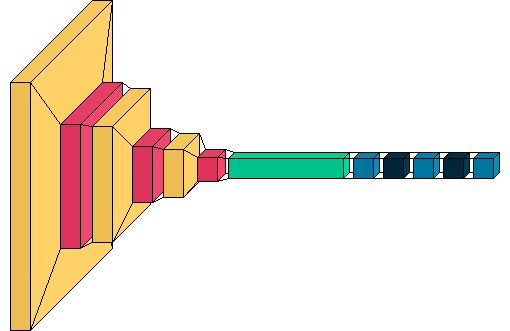

In [43]:
# model architecture is visualised by using visual keras
import visualkeras
visualkeras.layered_view(model)

<a id='Model_training'></a>
# 7.Model Training

In [24]:
#fitting train data to model
hist = model.fit(x=train_generator, validation_data=validation, epochs=10)

Epoch 1/10
57/57 [==============================] - 132s 2s/step - loss: 0.6006 - accuracy: 0.6837 - val_loss: 0.5190 - val_accuracy: 0.7570
Epoch 2/10
57/57 [==============================] - 125s 2s/step - loss: 0.5144 - accuracy: 0.7684 - val_loss: 0.4649 - val_accuracy: 0.7913
Epoch 3/10
57/57 [==============================] - 130s 2s/step - loss: 0.4407 - accuracy: 0.8141 - val_loss: 0.4188 - val_accuracy: 0.8224
Epoch 4/10
57/57 [==============================] - 129s 2s/step - loss: 0.4033 - accuracy: 0.8383 - val_loss: 0.4123 - val_accuracy: 0.8162
Epoch 5/10
57/57 [==============================] - 128s 2s/step - loss: 0.4011 - accuracy: 0.8344 - val_loss: 0.3513 - val_accuracy: 0.8598
Epoch 6/10
57/57 [==============================] - 117s 2s/step - loss: 0.3181 - accuracy: 0.8790 - val_loss: 0.3694 - val_accuracy: 0.8474
Epoch 7/10
57/57 [==============================] - 82s 1s/step - loss: 0.3117 - accuracy: 0.8768 - val_loss: 0.3294 - val_accuracy: 0.8754
Epoch 8/10
57/

In [25]:
# collecting history of epoch in variable aa
aa = hist.history

In [26]:
#checking keys 
aa.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

In [ ]:
#Saving the model
model.save("model1_House Vs Non House_20epoch.h5")

<a id='acc_loss_model'></a>
# 8.Visualising Accuracy and loss for training and Validation Data

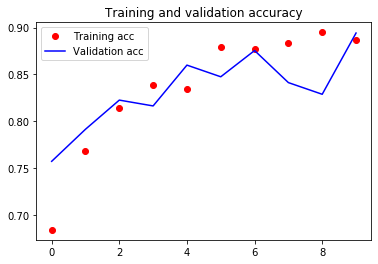

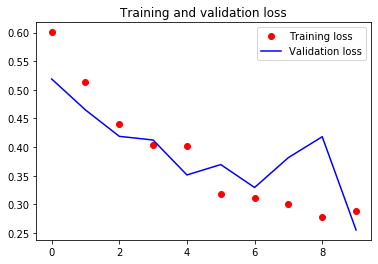

In [27]:
# PLOTTING THE LOSS AND ACCURACY

acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']
loss = hist.history['loss']
val_loss = hist.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'ro', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'ro', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [28]:
train_generator.class_indices

{'House': 0, 'Not_House': 1}

In [29]:
#importing keras library image to load img
from keras.preprocessing import image

In [30]:
# function to test the model and predict house or not house
def testing_image(image_directory):
    test_image = image.load_img(image_directory, target_size = (64, 64))
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image, axis = 0)
    result = model.predict(test_image)
    result = np.argmax(result)
    if result == 0:
        print('House')
    else:
        print('Not_House')

<a id='vis_pred'></a>

# 9. Sample prediction:

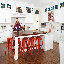

In [32]:
#1.testing test image 
new_image = image.load_img('Image (1).jpeg',target_size=(64,64))
new_image

In [33]:
testing_image('Image (1).jpeg')

House


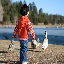

In [34]:
#2. testing test image 
new_image2 = image.load_img('Image (4).jpg',target_size=(64,64))
new_image2

In [35]:
testing_image('Image (4).jpg')

Not_House


In [39]:
import os
directory = 'Testing /'

In [40]:
print('For predicting we have :',len(os.listdir(directory)))

For predicting we have : 575


<a id='pred_all'></a>

# 10. Predicting all images in test dataset

House


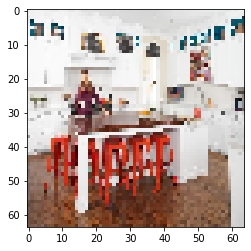

House


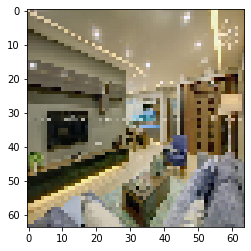

House


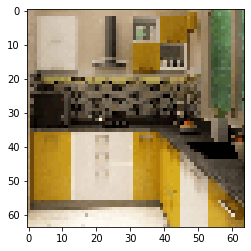

House


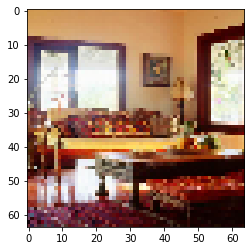

House


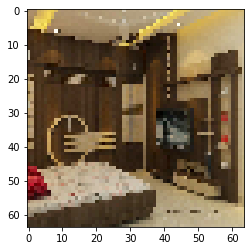

House


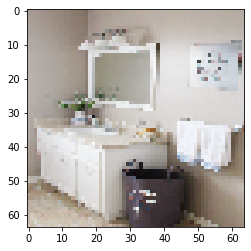

Not_House


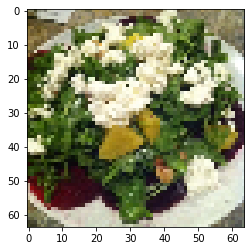

Not_House


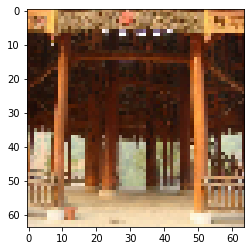

House


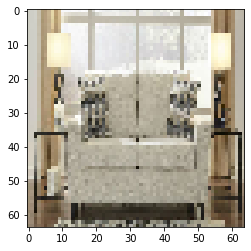

House


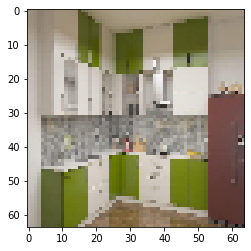

Not_House


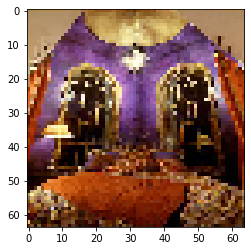

House


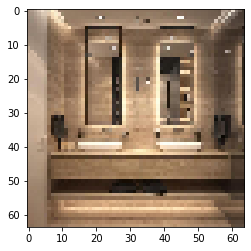

House


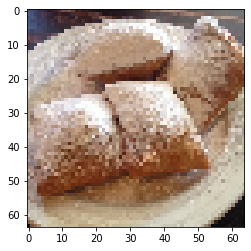

Not_House


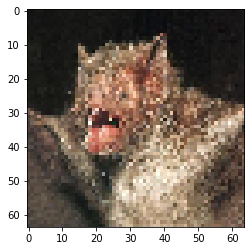

House


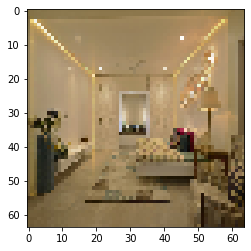

Not_House


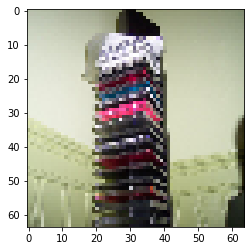

House


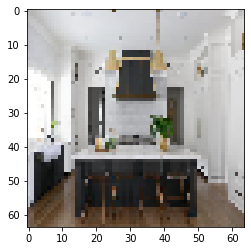

Not_House


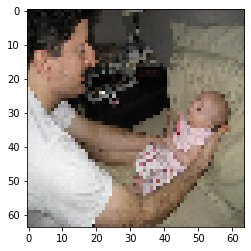

House


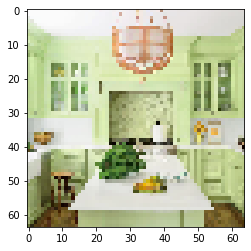

House


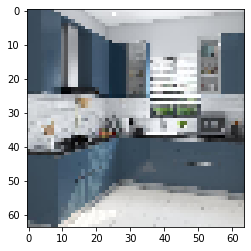

Not_House


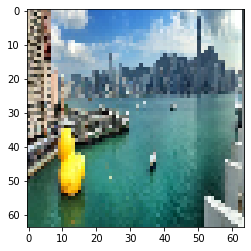

Not_House


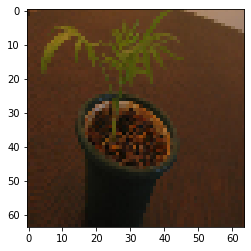

House


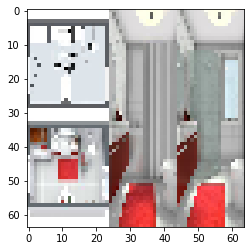

Not_House


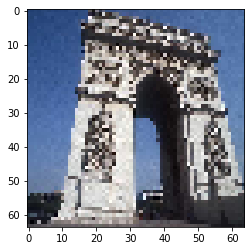

House


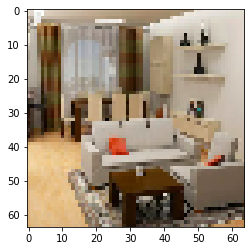

Not_House


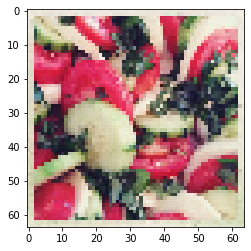

Not_House


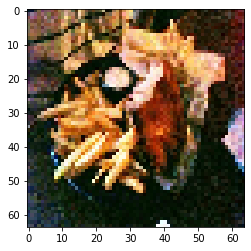

House


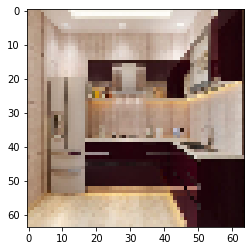

House


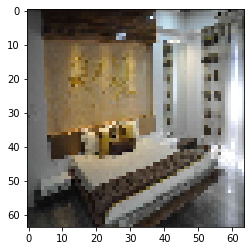

House


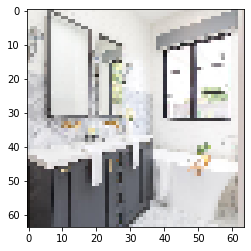

Not_House


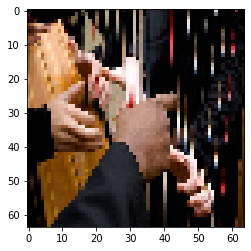

House


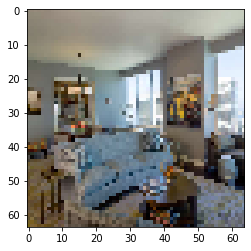

Not_House


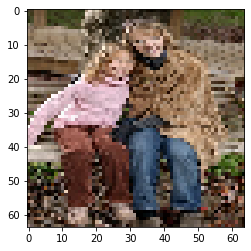

House


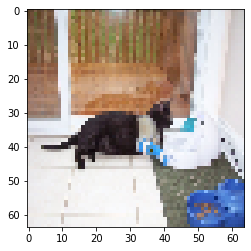

House


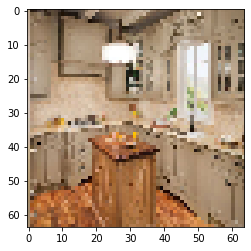

House


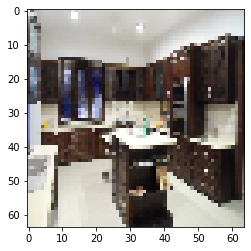

House


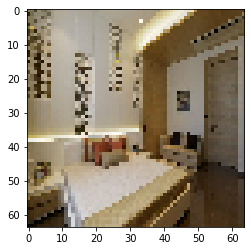

Not_House


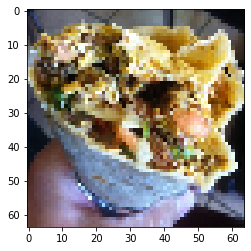

House


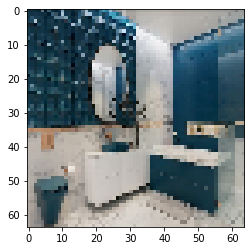

Not_House


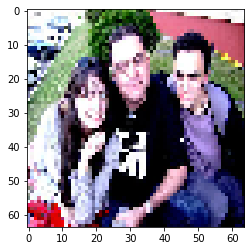

Not_House


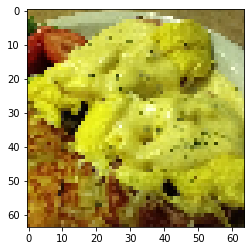

Not_House


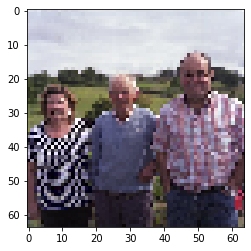

House


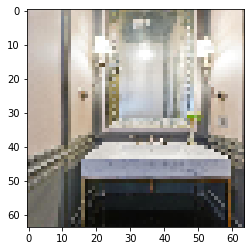

Not_House


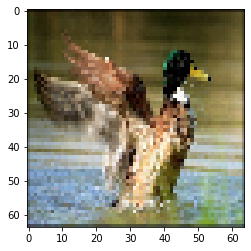

House


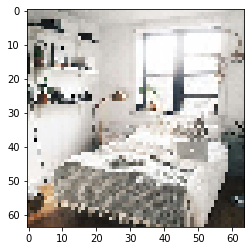

Not_House


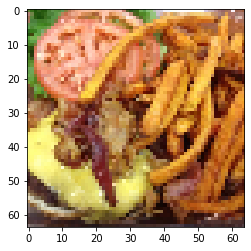

House


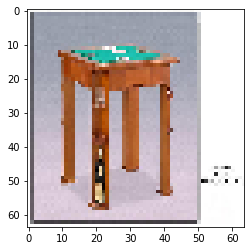

House


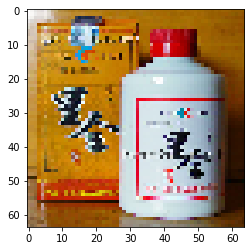

House


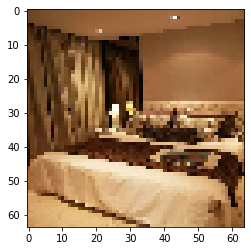

House


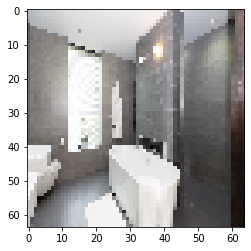

House


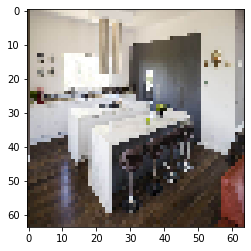

House


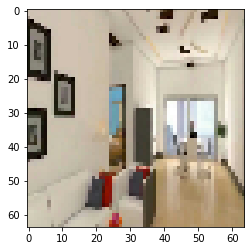

House


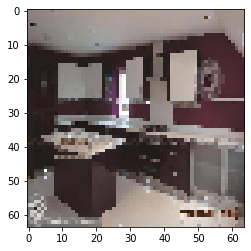

Not_House


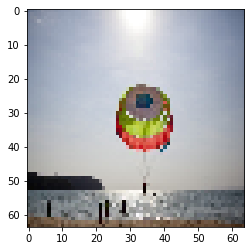

Not_House


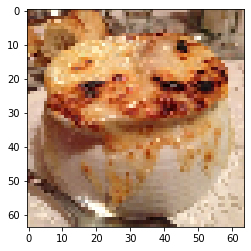

House


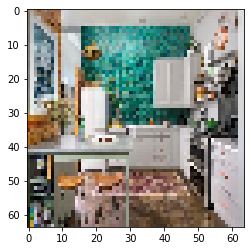

House


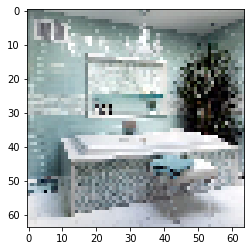

House


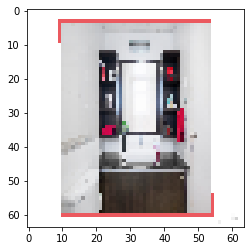

Not_House


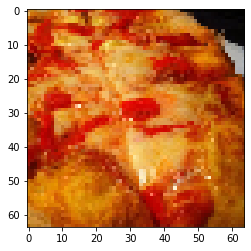

Not_House


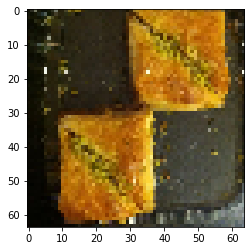

House


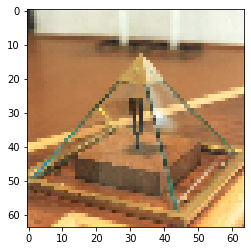

House


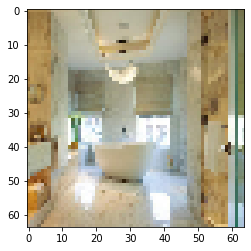

House


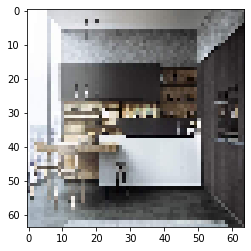

Not_House


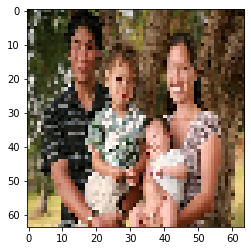

Not_House


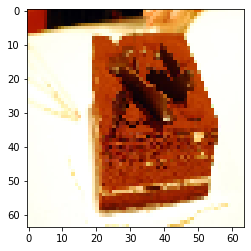

House


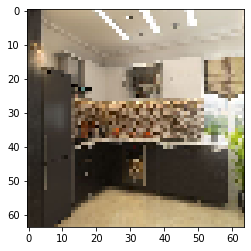

House


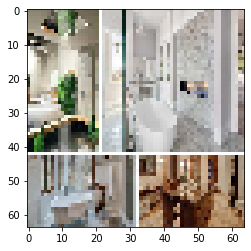

House


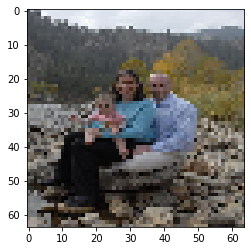

House


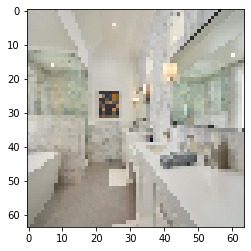

Not_House


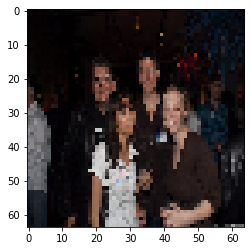

House


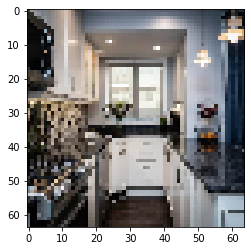

Not_House


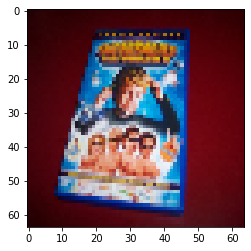

House


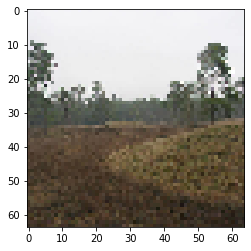

Not_House


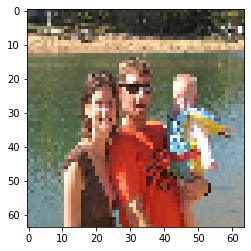

House


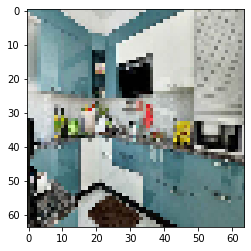

House


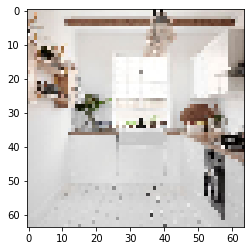

Not_House


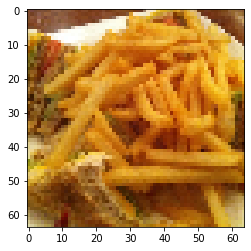

House


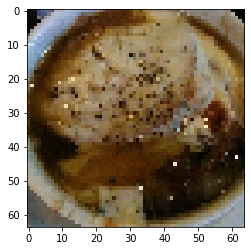

House


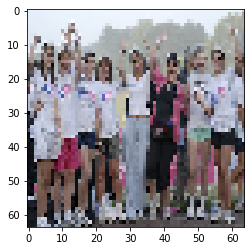

House


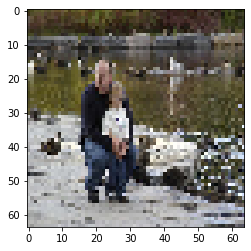

Not_House


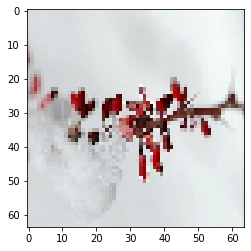

House


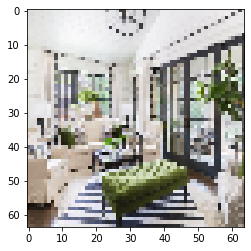

House


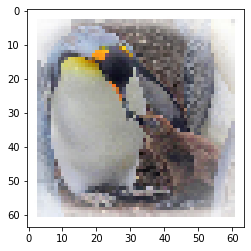

House


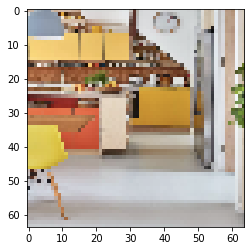

Not_House


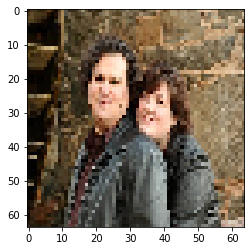

House


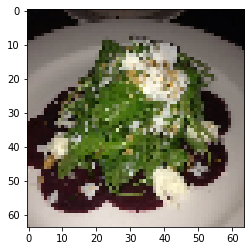

House


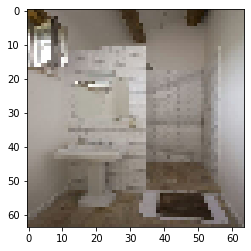

House


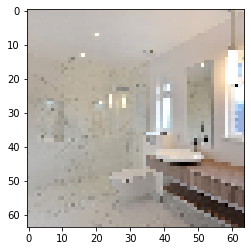

Not_House


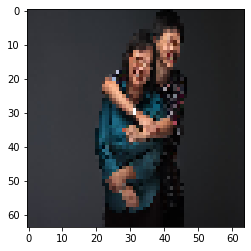

House


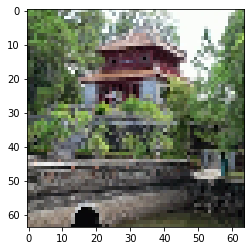

Not_House


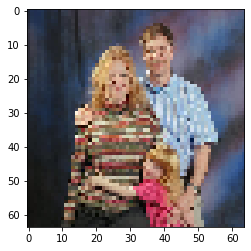

Not_House


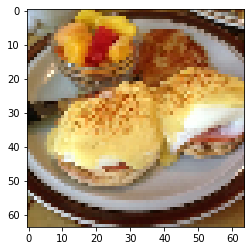

House


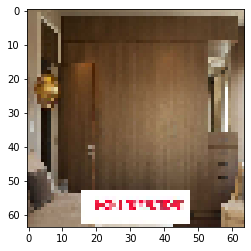

House


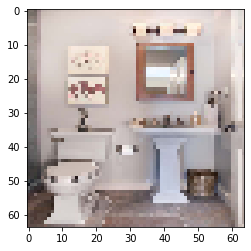

House


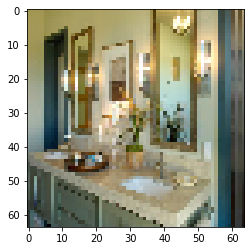

House


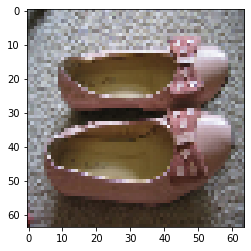

House


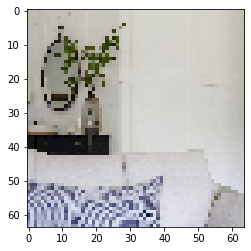

House


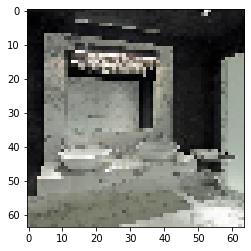

House


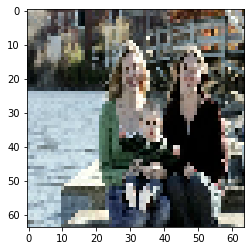

Not_House


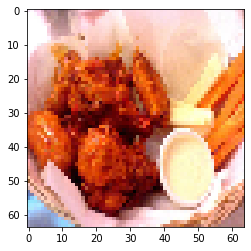

House


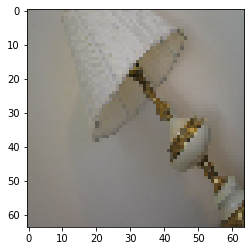

House


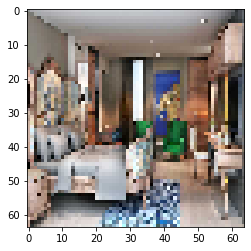

Not_House


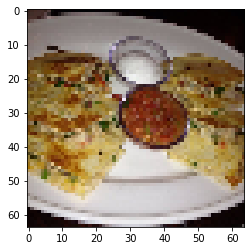

Not_House


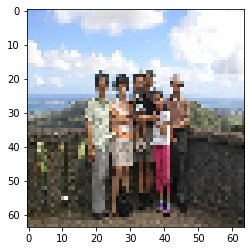

House


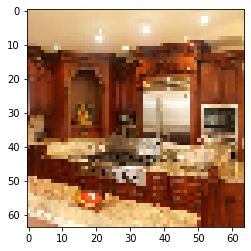

House


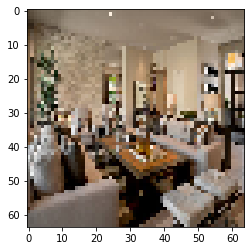

House


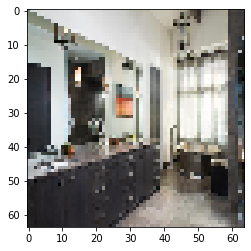

House


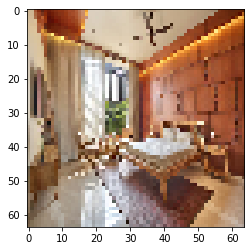

House


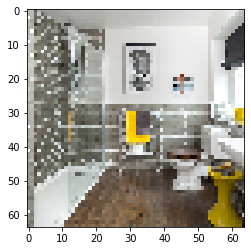

Not_House


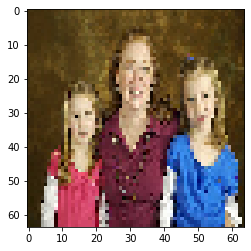

House


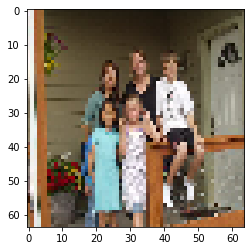

Not_House


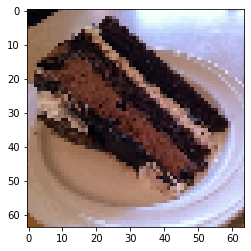

House


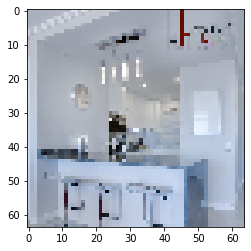

House


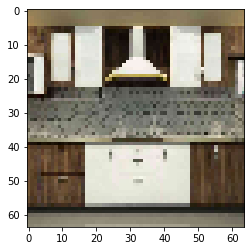

Not_House


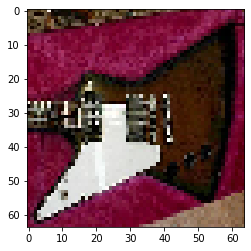

House


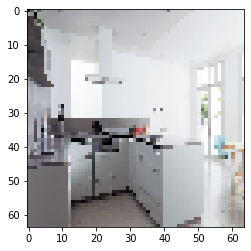

Not_House


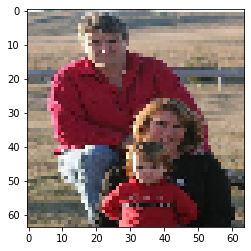

Not_House


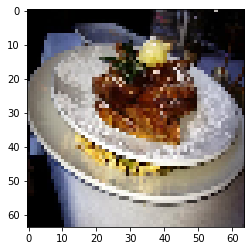

Not_House


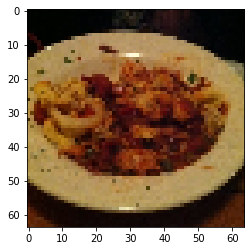

House


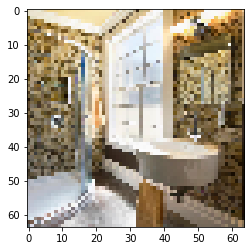

Not_House


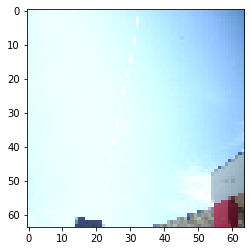

House


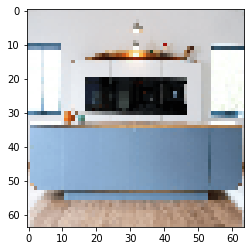

House


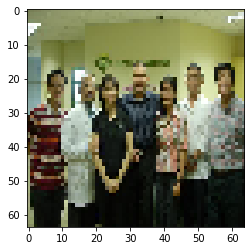

Not_House


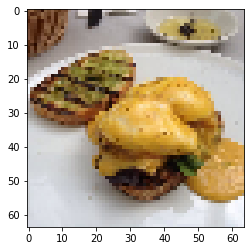

House


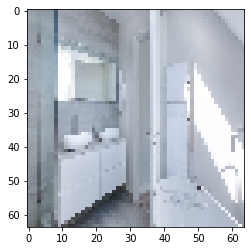

House


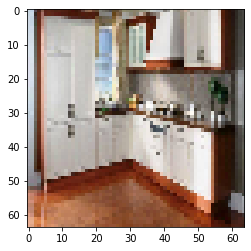

House


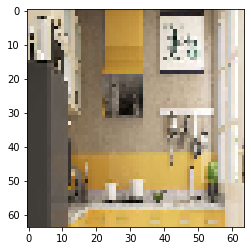

Not_House


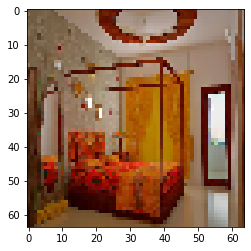

House


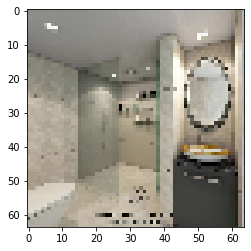

House


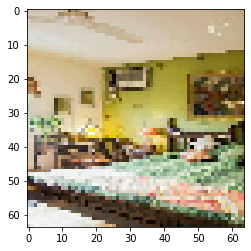

House


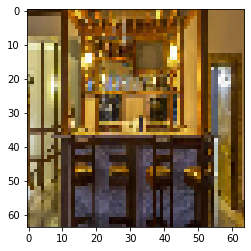

Not_House


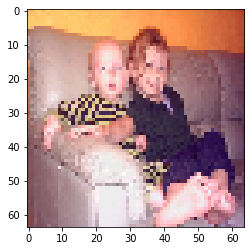

House


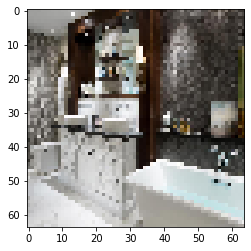

Not_House


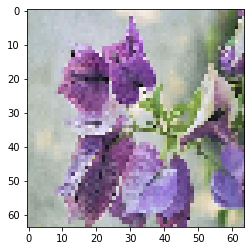

House


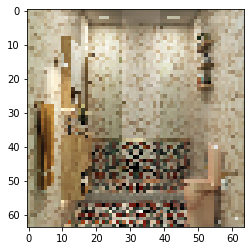

House


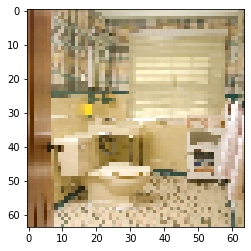

Not_House


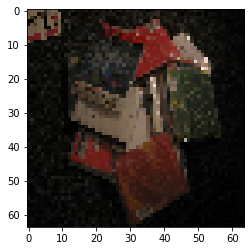

House


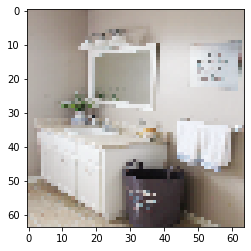

Not_House


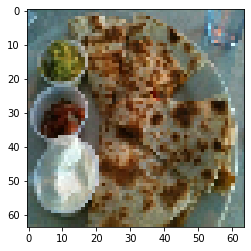

House


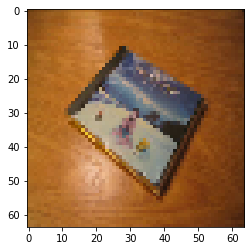

Not_House


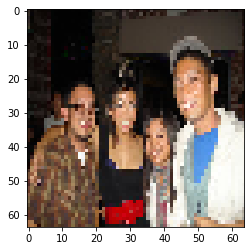

House


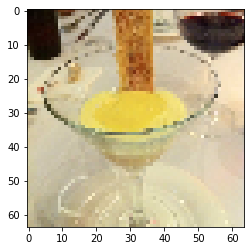

House


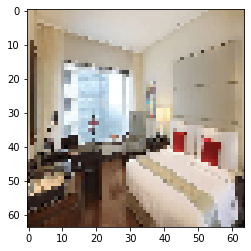

Not_House


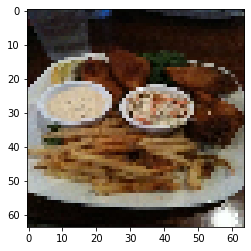

House


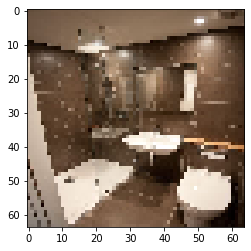

Not_House


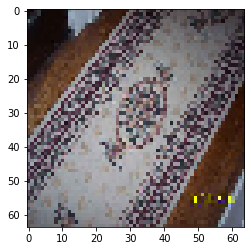

House


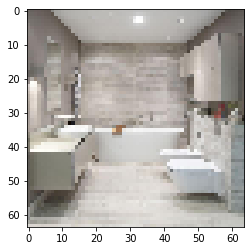

House


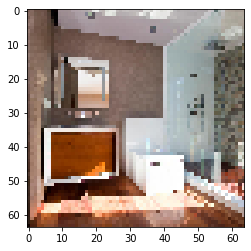

Not_House


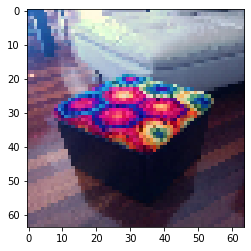

House


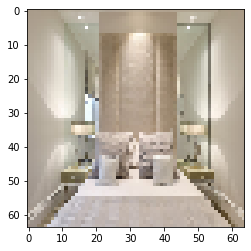

House


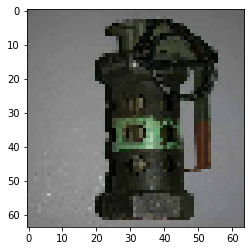

Not_House


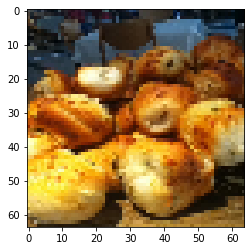

House


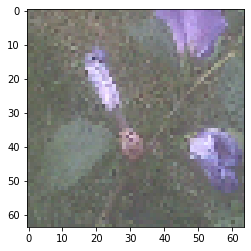

House


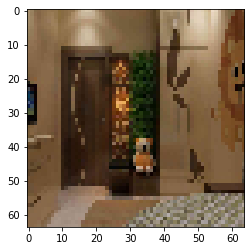

Not_House


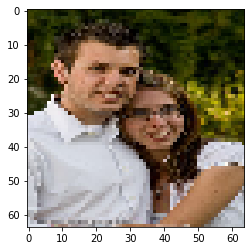

Not_House


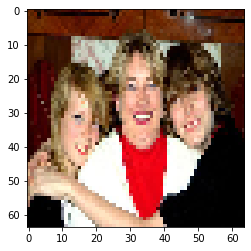

Not_House


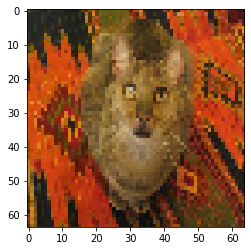

Not_House


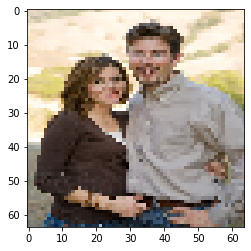

House


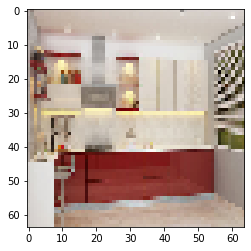

Not_House


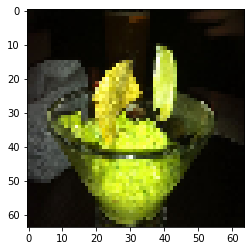

House


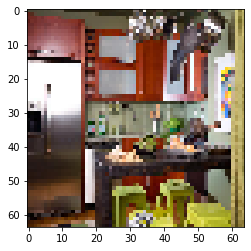

House


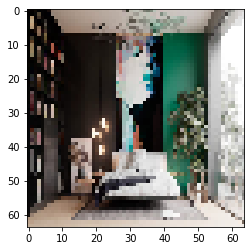

House


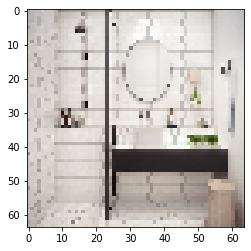

House


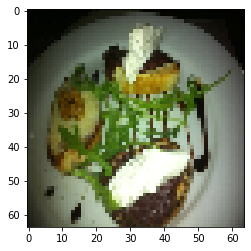

House


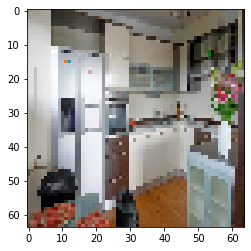

House


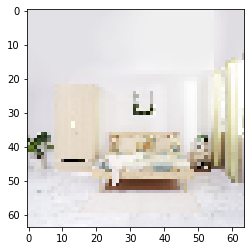

House


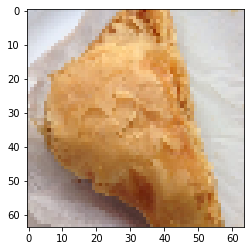

Not_House


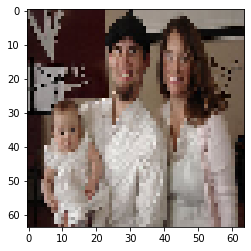

Not_House


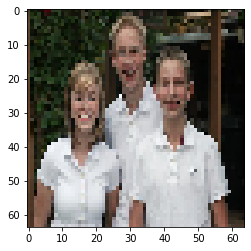

House


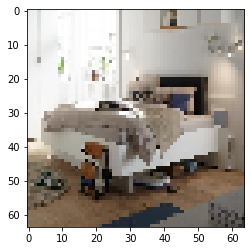

House


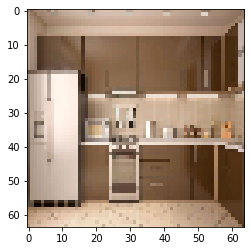

House


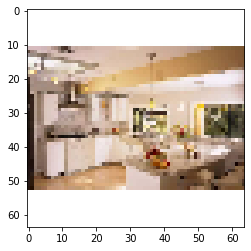

House


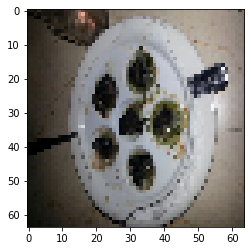

House


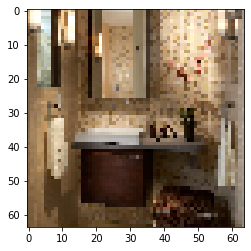

Not_House


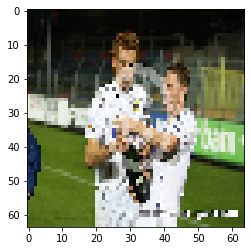

House


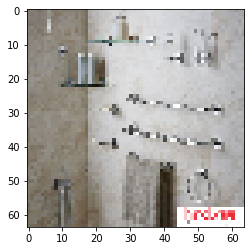

Not_House


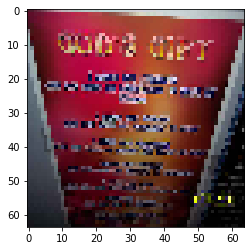

House


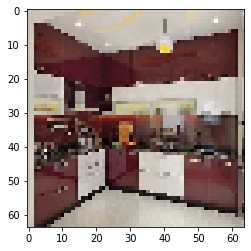

House


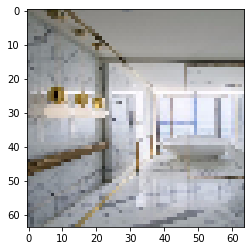

Not_House


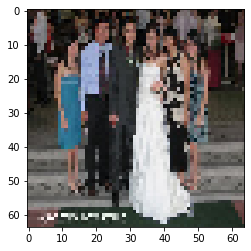

Not_House


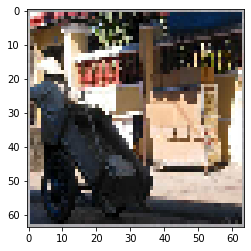

Not_House


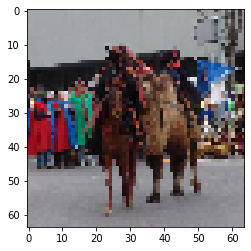

Not_House


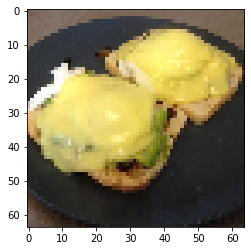

House


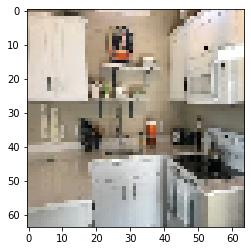

House


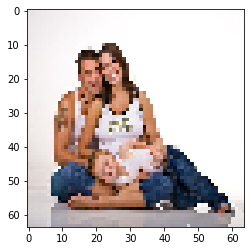

House


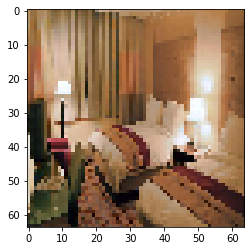

House


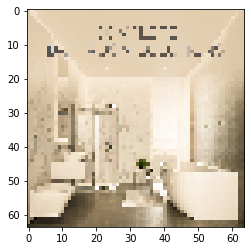

Not_House


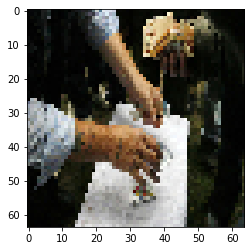

House


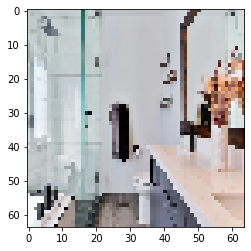

Not_House


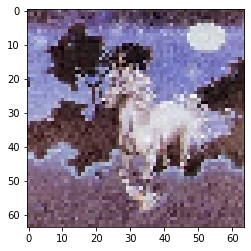

House


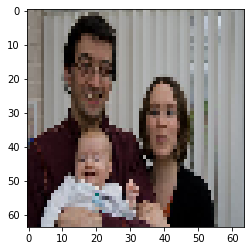

Not_House


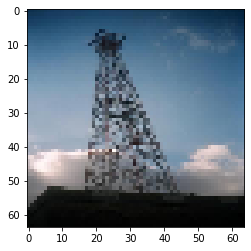

House


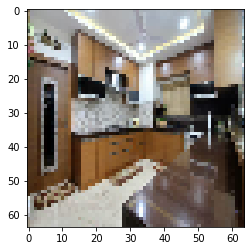

House


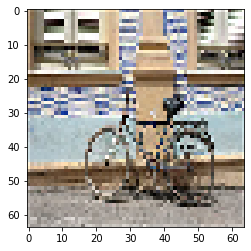

Not_House


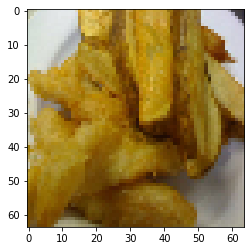

House


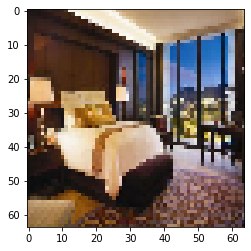

House


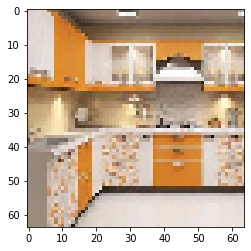

House


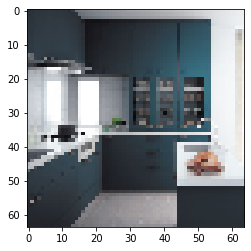

House


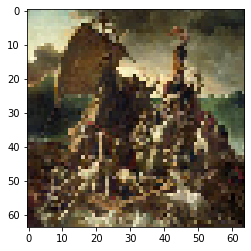

House


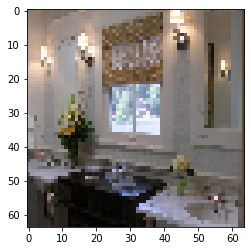

House


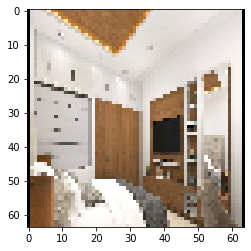

House


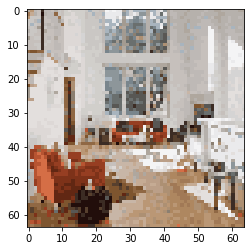

House


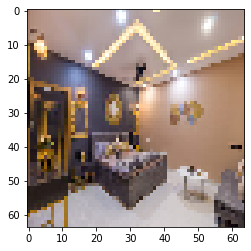

Not_House


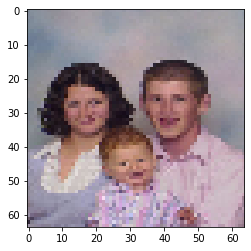

House


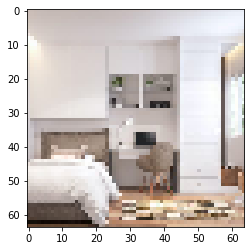

Not_House


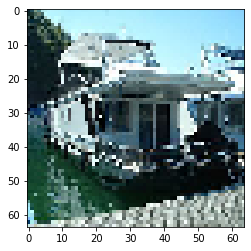

House


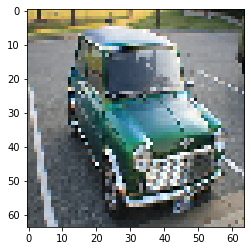

House


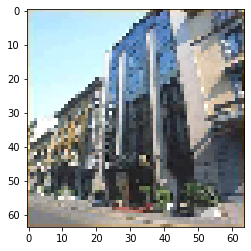

House


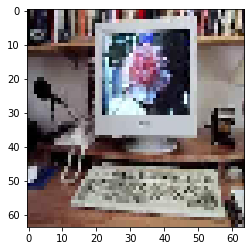

House


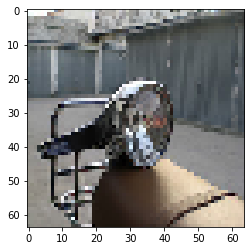

House


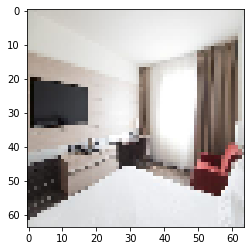

House


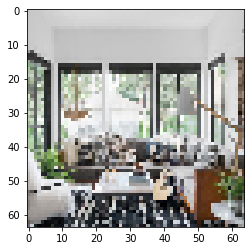

House


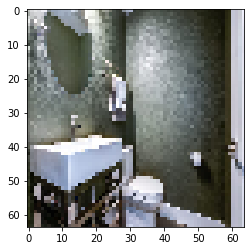

House


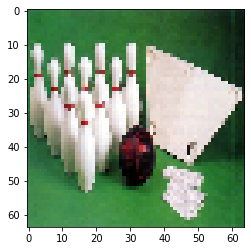

House


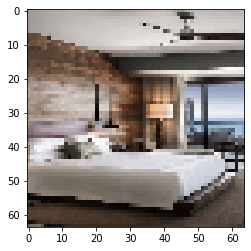

House


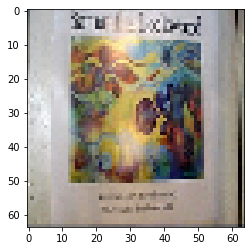

House


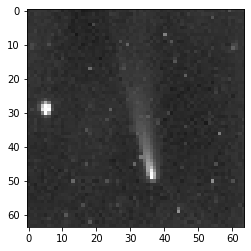

House


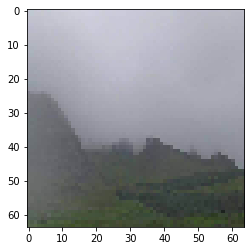

Not_House


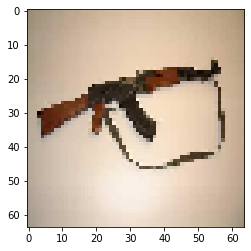

Not_House


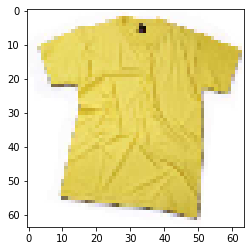

House


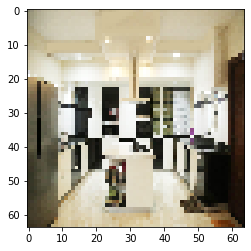

House


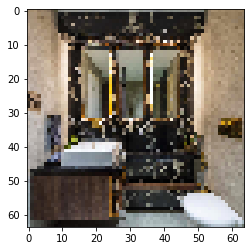

House


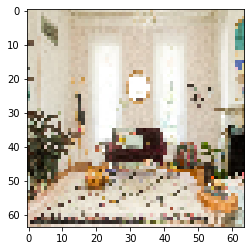

House


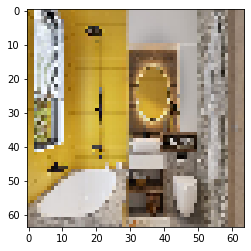

House


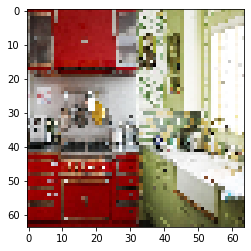

House


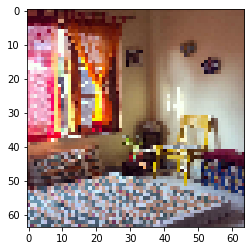

House


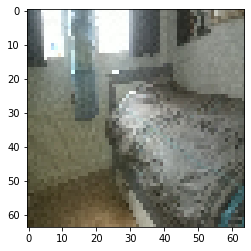

House


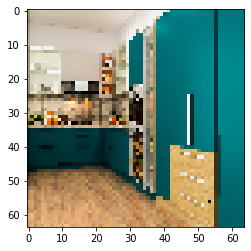

House


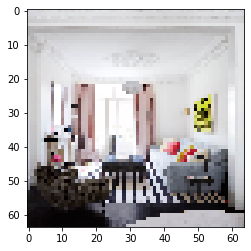

House


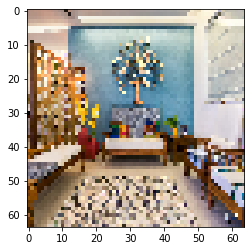

House


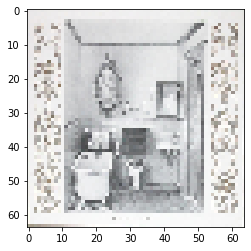

House


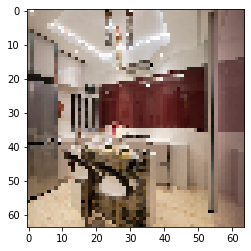

House


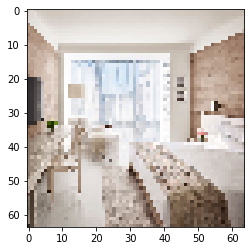

House


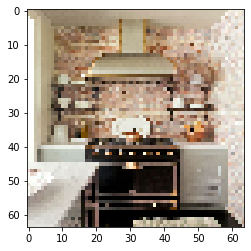

House


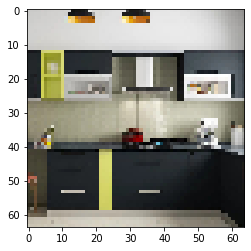

House


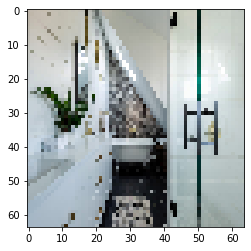

House


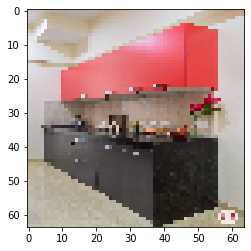

House


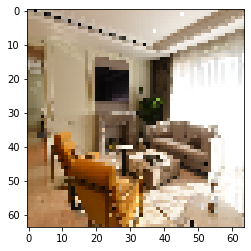

House


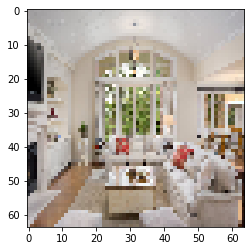

House


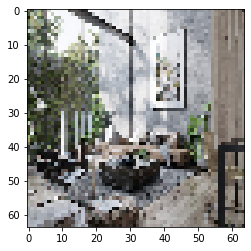

House


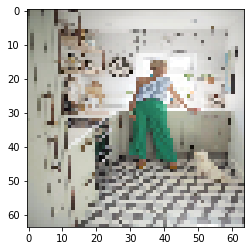

House


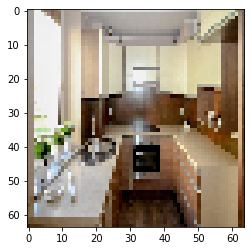

House


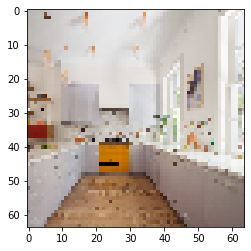

House


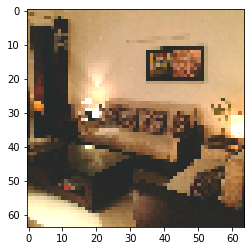

House


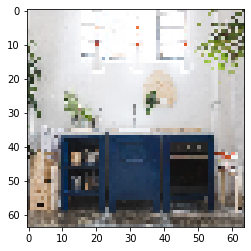

House


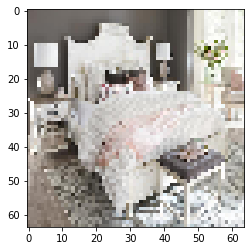

House


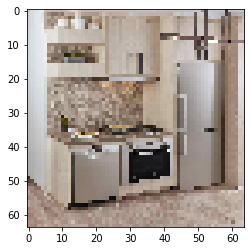

House


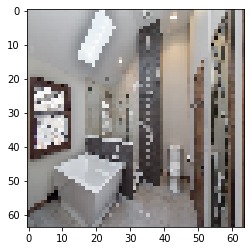

House


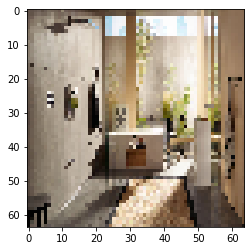

House


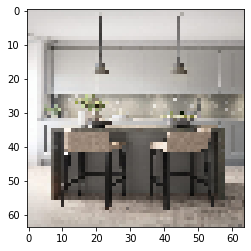

House


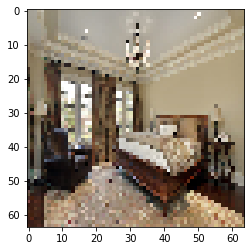

House


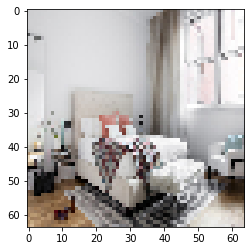

House


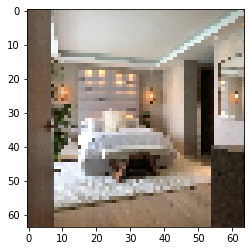

House


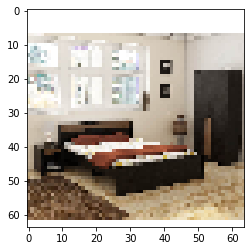

House


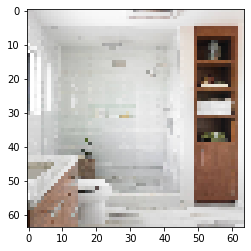

House


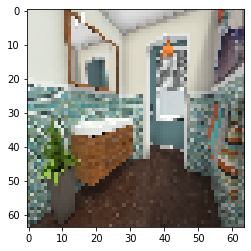

Not_House


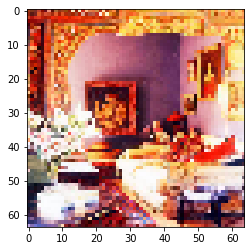

House


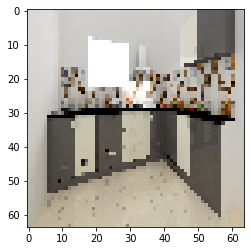

House


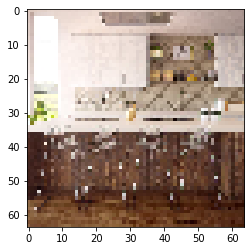

House


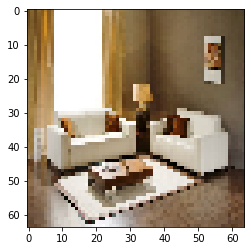

House


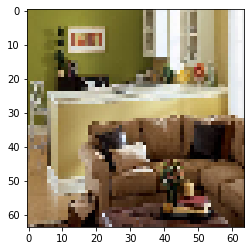

House


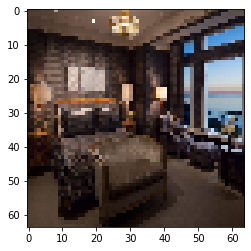

House


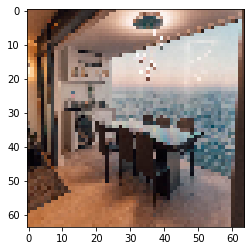

House


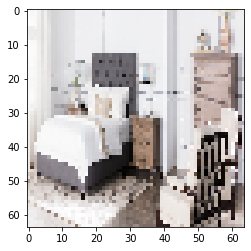

Not_House


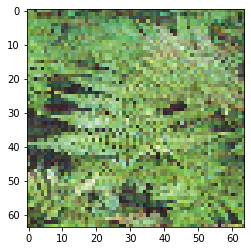

House


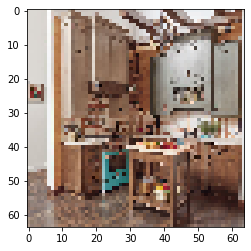

Not_House


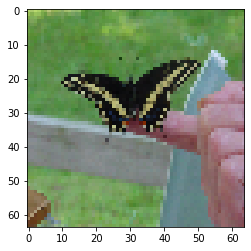

House


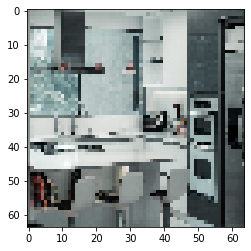

House


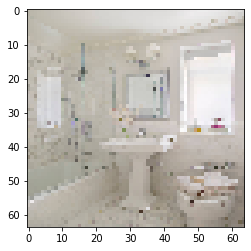

House


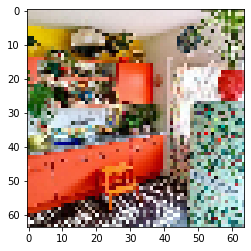

Not_House


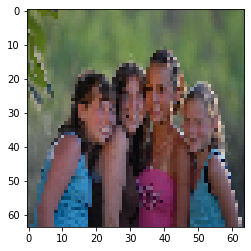

House


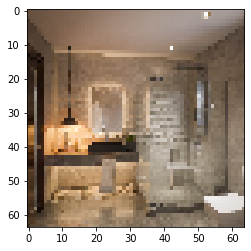

House


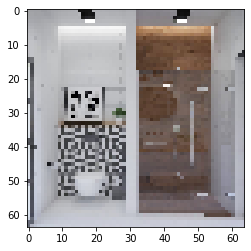

House


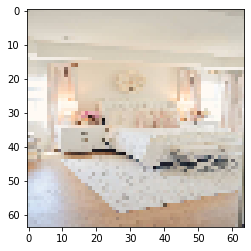

Not_House


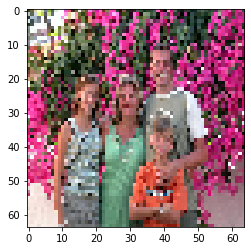

House


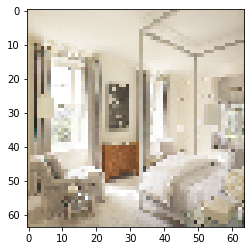

House


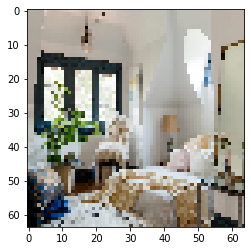

House


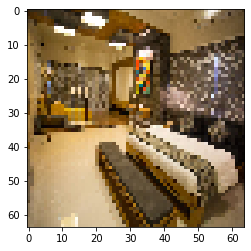

House


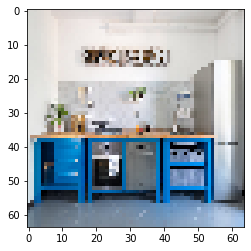

House


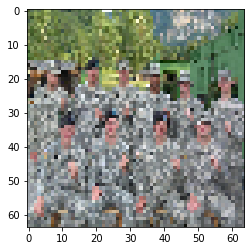

House


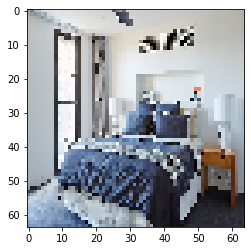

House


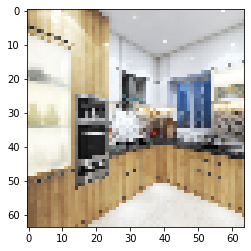

House


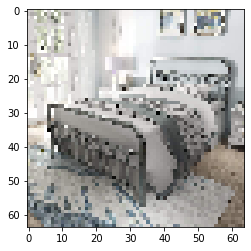

House


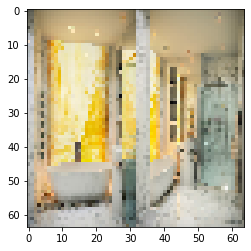

Not_House


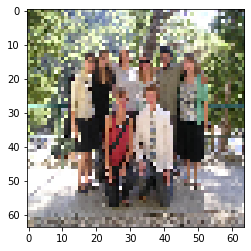

House


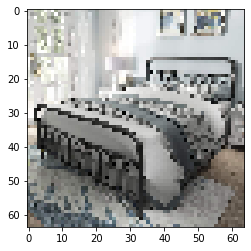

House


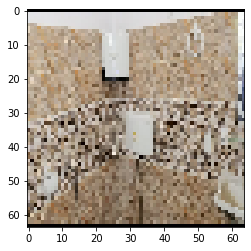

House


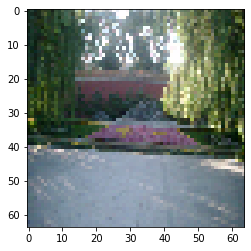

House


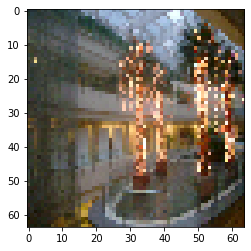

Not_House


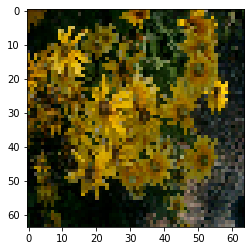

House


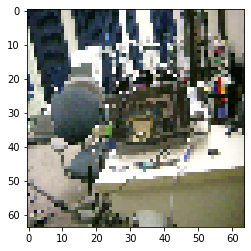

Not_House


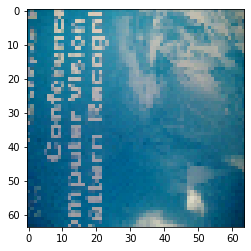

House


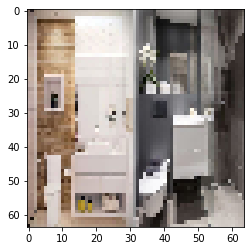

House


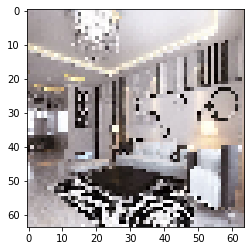

House


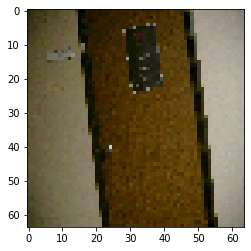

House


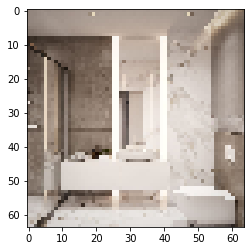

House


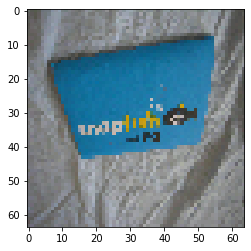

Not_House


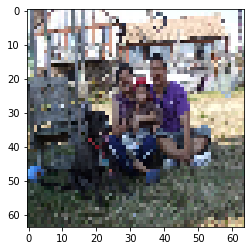

Not_House


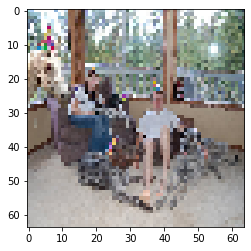

House


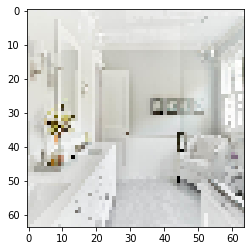

House


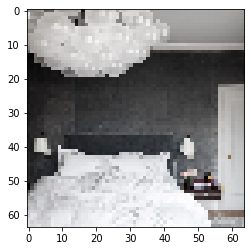

House


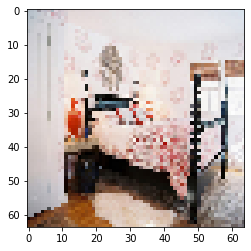

House


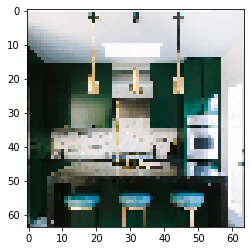

House


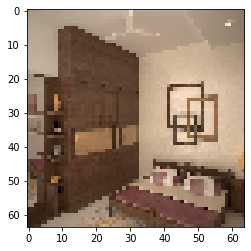

Not_House


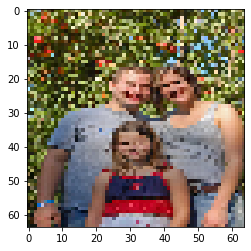

House


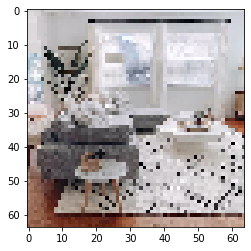

Not_House


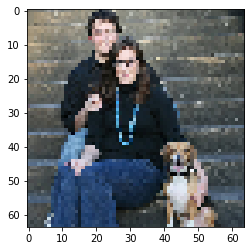

Not_House


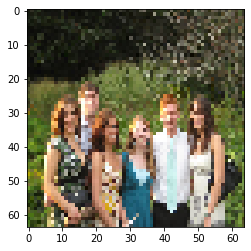

House


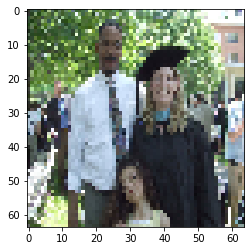

Not_House


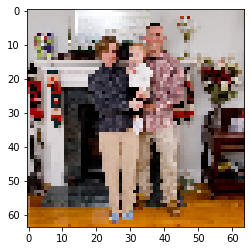

Not_House


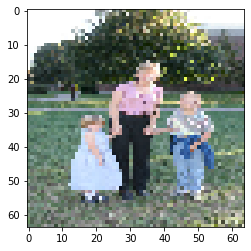

Not_House


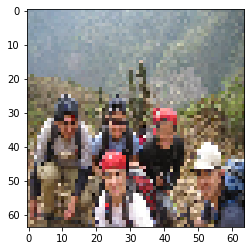

House


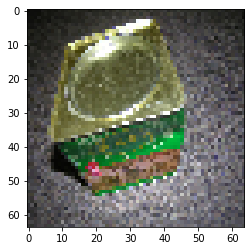

House


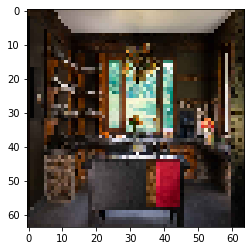

House


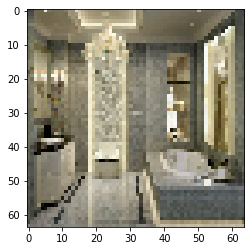

Not_House


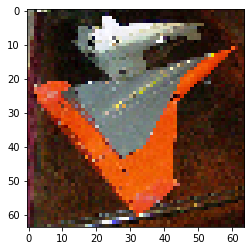

Not_House


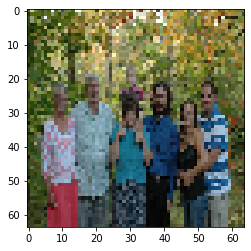

House


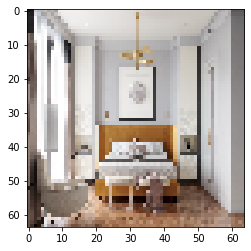

House


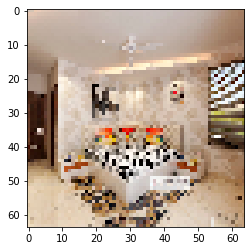

Not_House


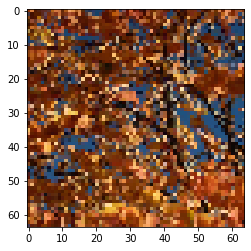

House


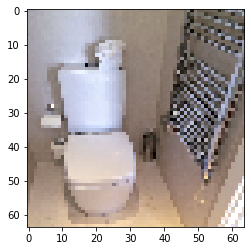

House


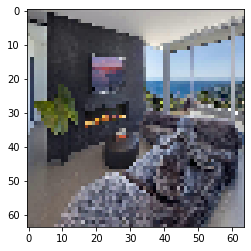

Not_House


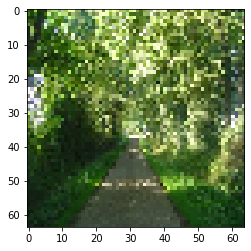

House


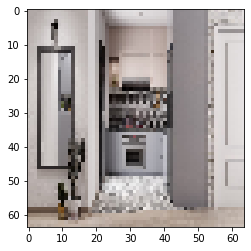

Not_House


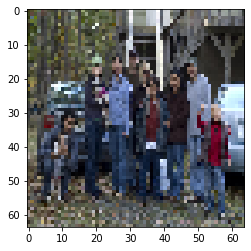

Not_House


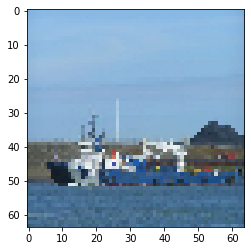

Not_House


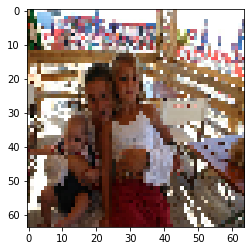

House


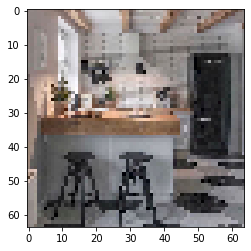

House


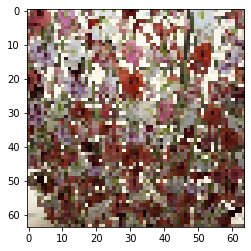

Not_House


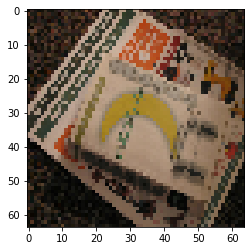

Not_House


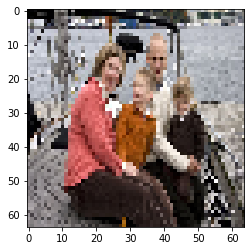

House


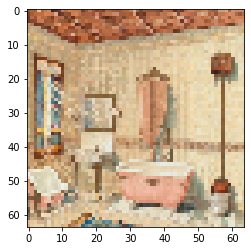

House


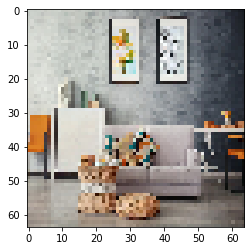

House


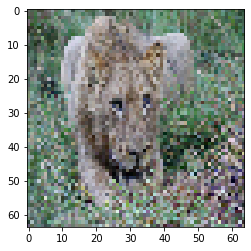

House


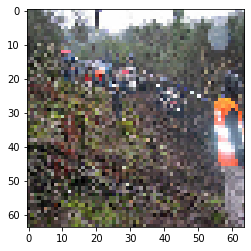

Not_House


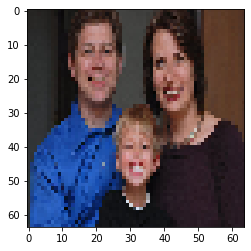

House


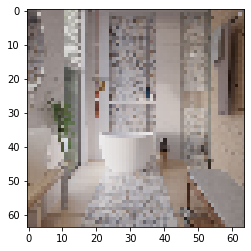

House


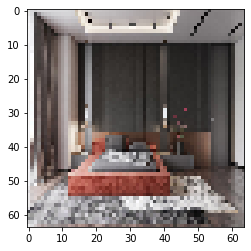

House


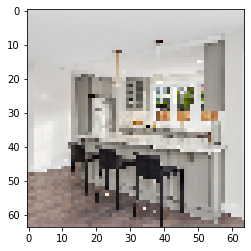

House


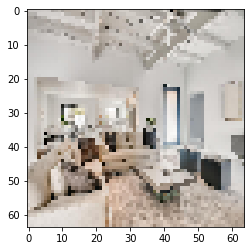

Not_House


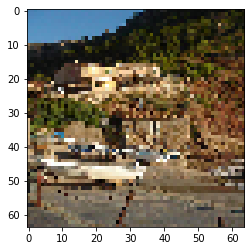

House


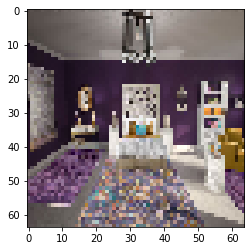

House


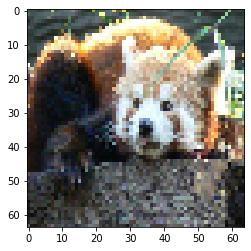

Not_House


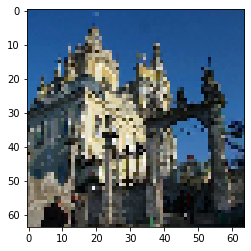

Not_House


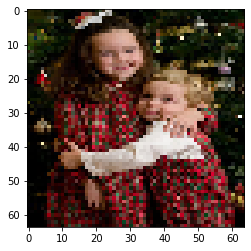

House


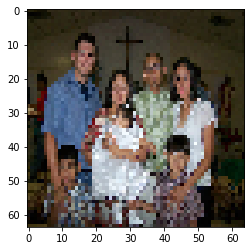

House


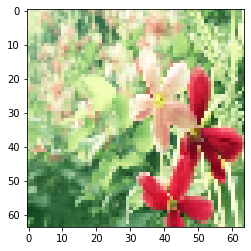

House


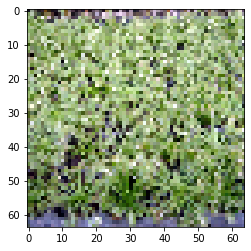

House


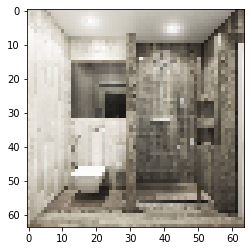

House


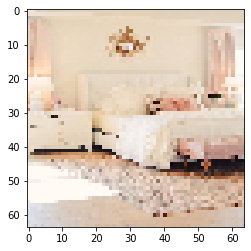

Not_House


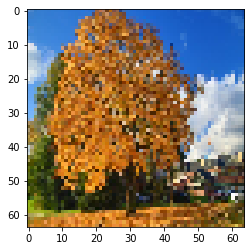

House


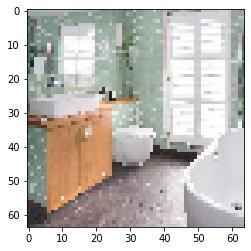

Not_House


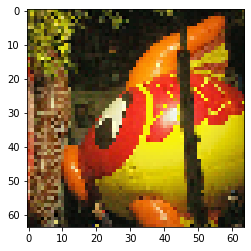

House


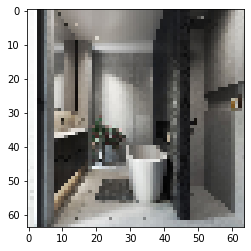

Not_House


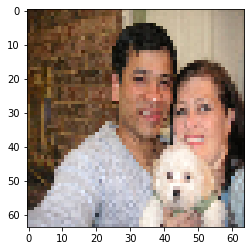

House


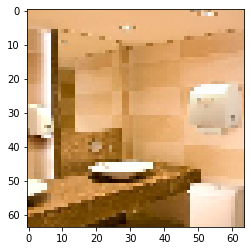

Not_House


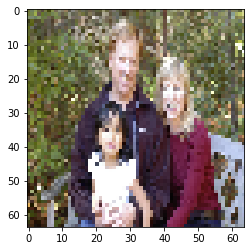

House


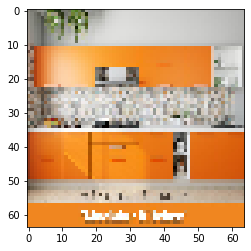

House


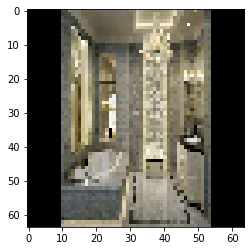

Not_House


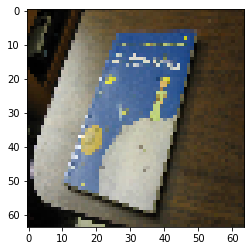

Not_House


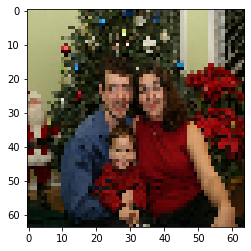

Not_House


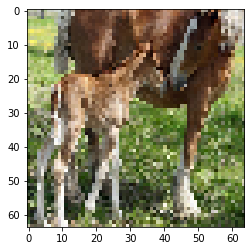

House


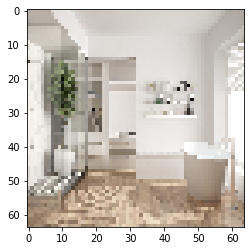

House


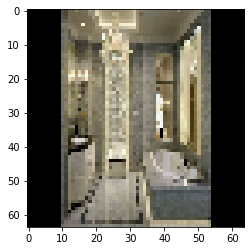

House


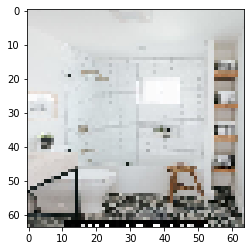

Not_House


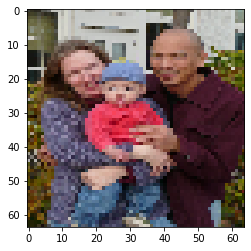

House


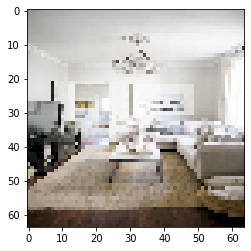

House


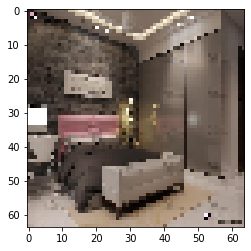

Not_House


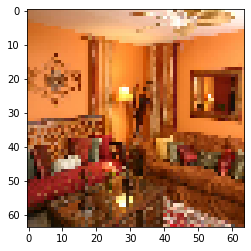

Not_House


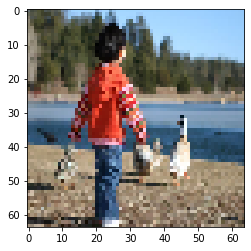

House


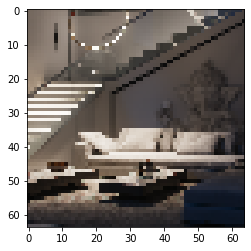

House


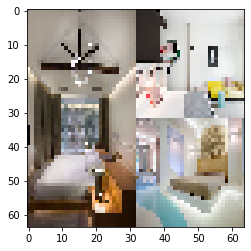

House


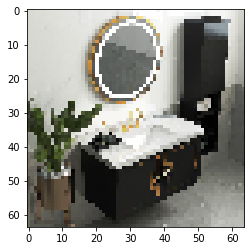

Not_House


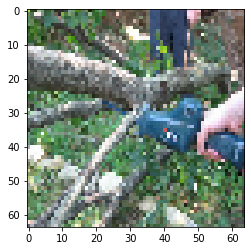

Not_House


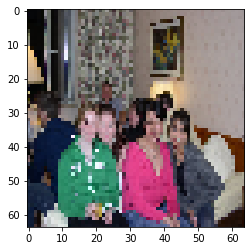

House


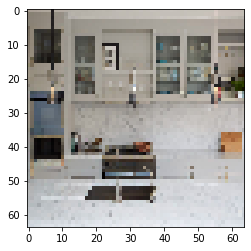

House


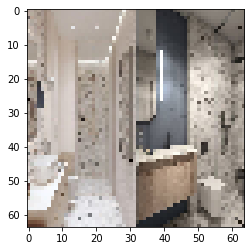

House


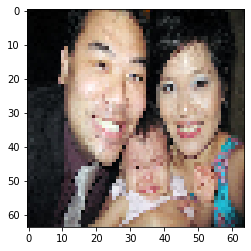

Not_House


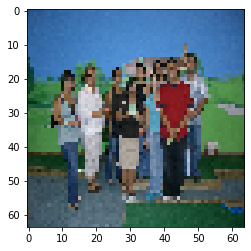

House


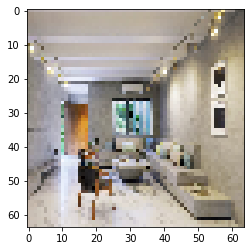

House


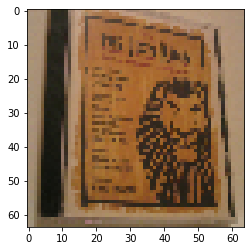

Not_House


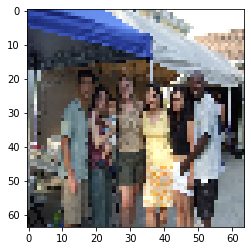

House


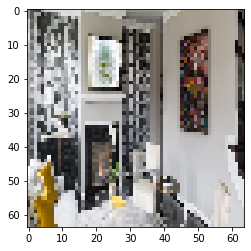

House


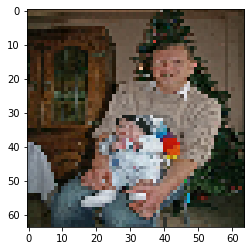

Not_House


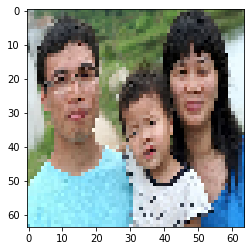

Not_House


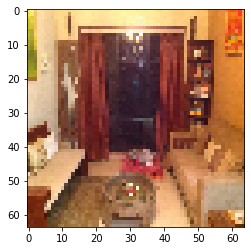

Not_House


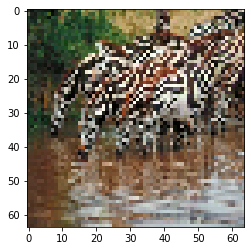

House


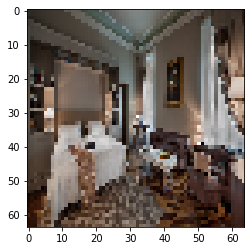

House


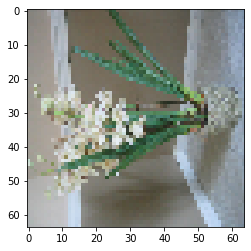

House


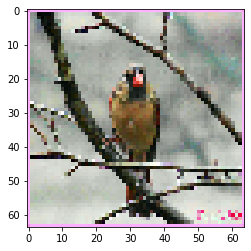

House


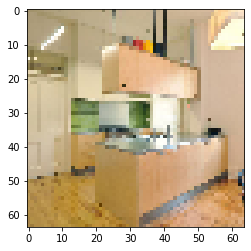

Not_House


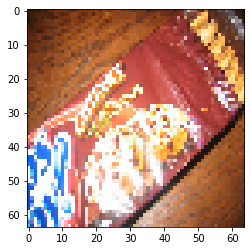

Not_House


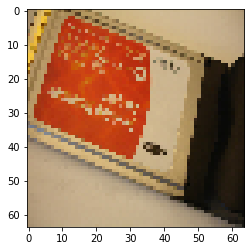

House


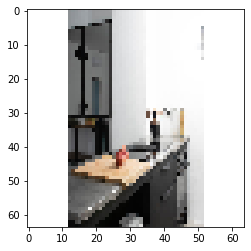

Not_House


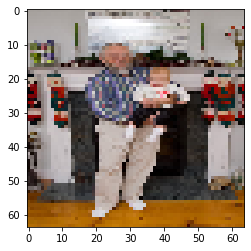

House


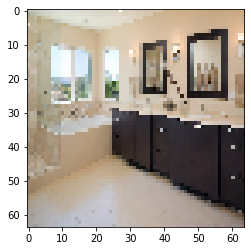

Not_House


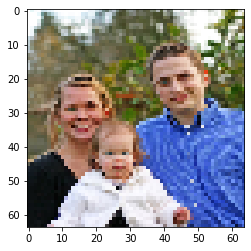

Not_House


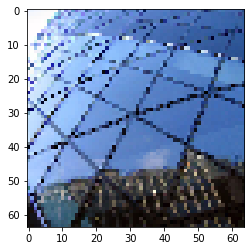

Not_House


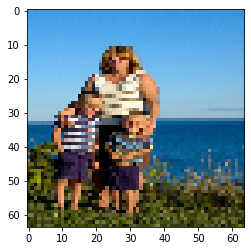

Not_House


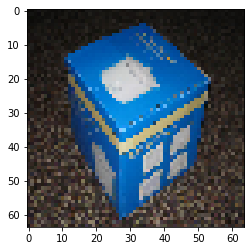

Not_House


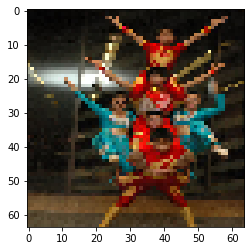

Not_House


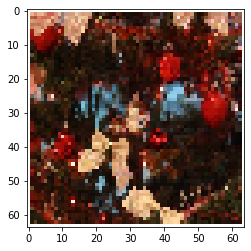

House


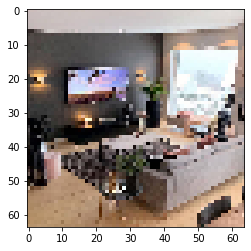

Not_House


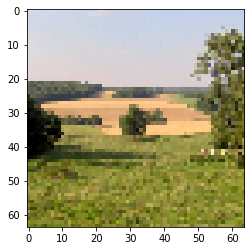

Not_House


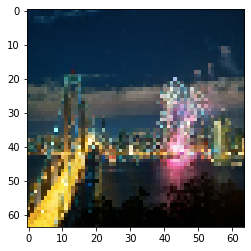

Not_House


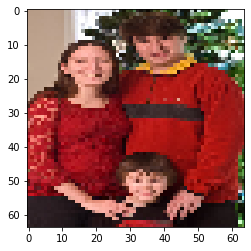

House


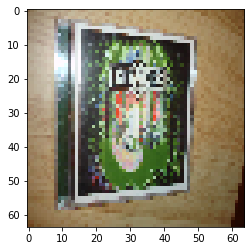

Not_House


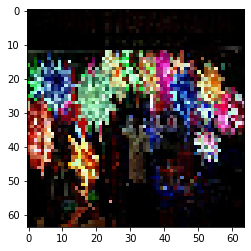

House


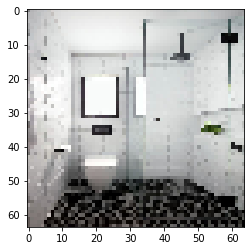

House


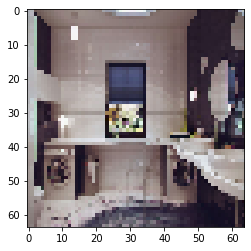

House


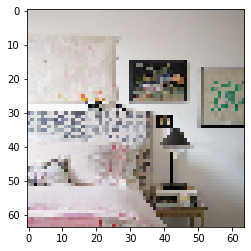

House


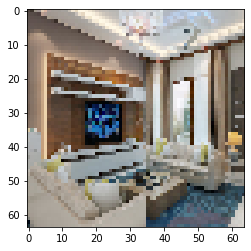

House


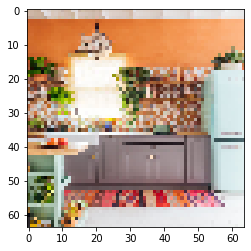

Not_House


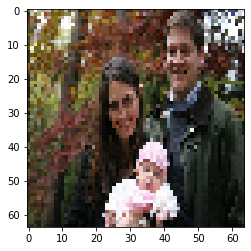

House


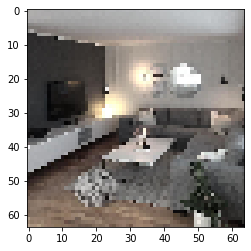

House


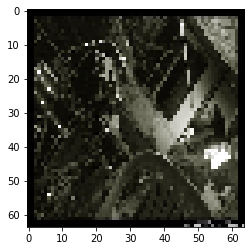

Not_House


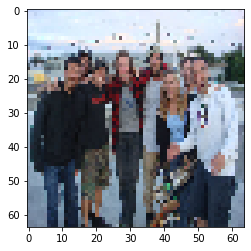

Not_House


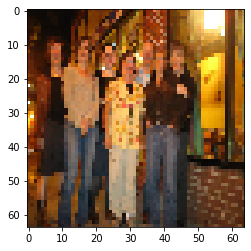

House


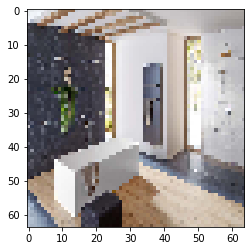

House


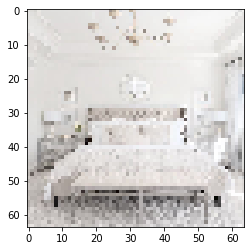

Not_House


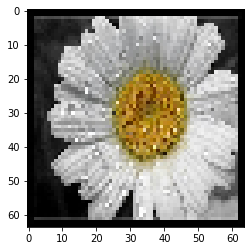

Not_House


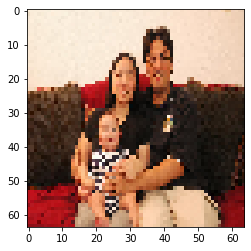

House


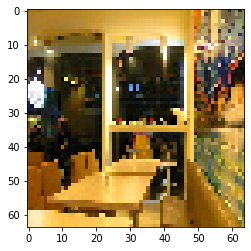

Not_House


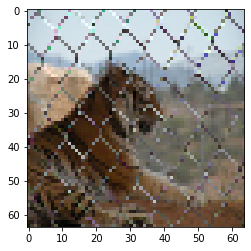

Not_House


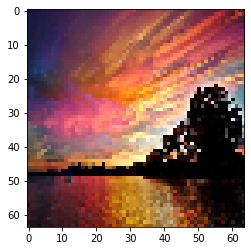

House


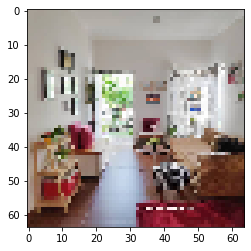

House


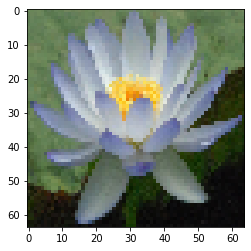

House


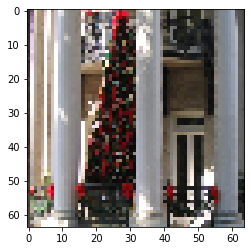

House


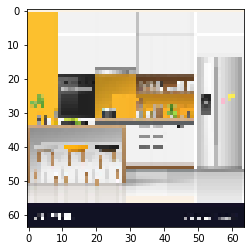

Not_House


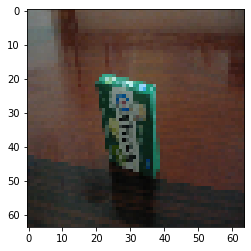

Not_House


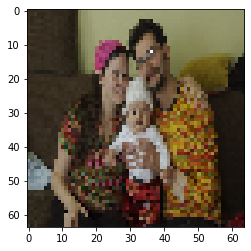

Not_House


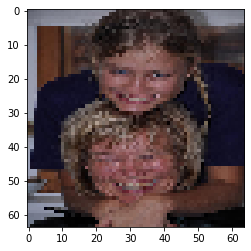

House


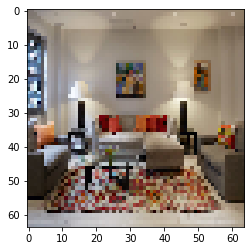

Not_House


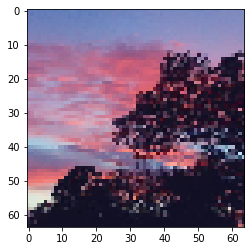

Not_House


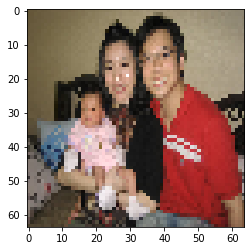

House


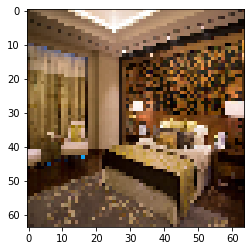

Not_House


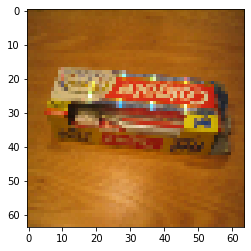

Not_House


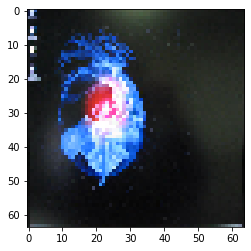

House


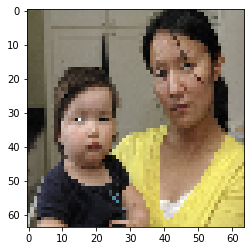

Not_House


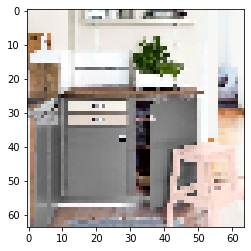

House


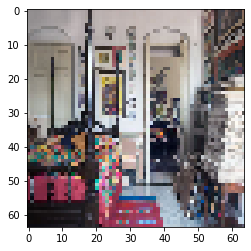

Not_House


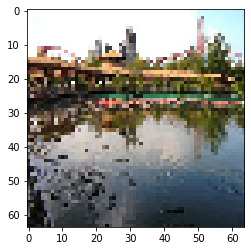

House


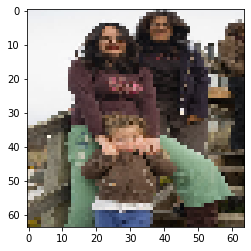

Not_House


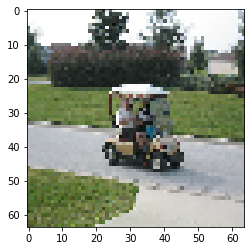

House


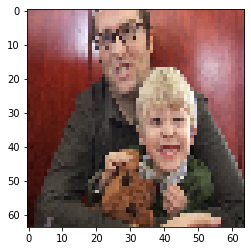

House


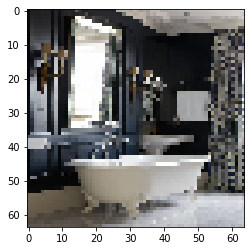

Not_House


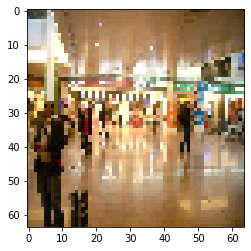

House


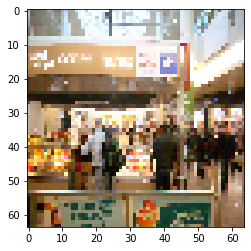

House


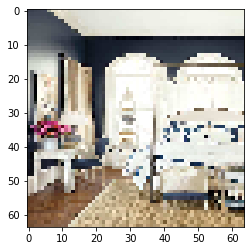

House


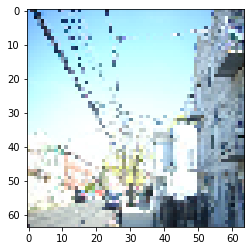

Not_House


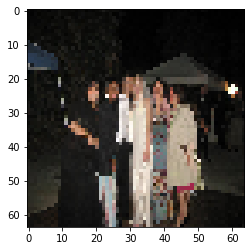

House


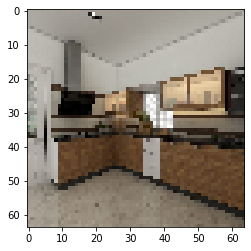

House


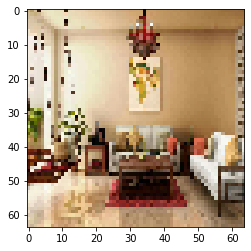

House


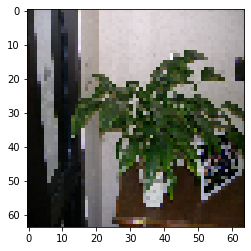

House


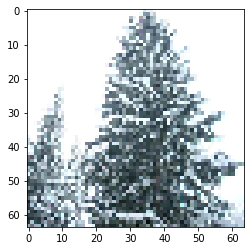

House


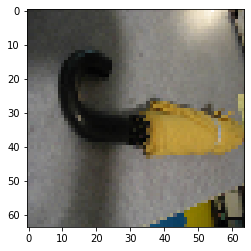

Not_House


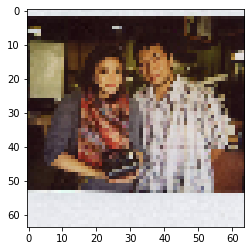

House


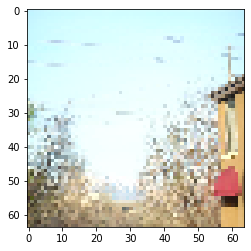

Not_House


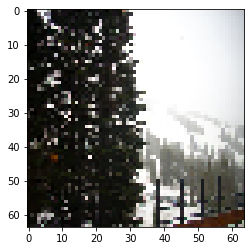

House


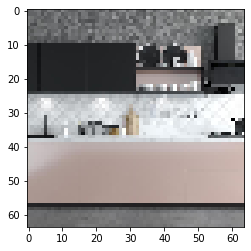

House


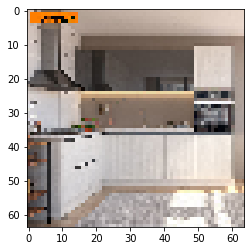

House


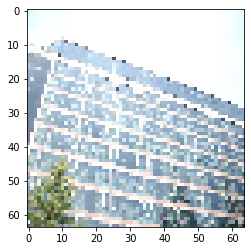

House


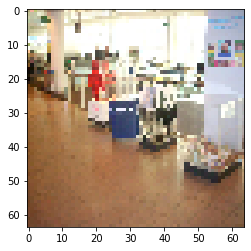

House


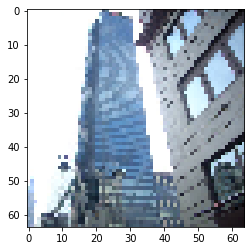

House


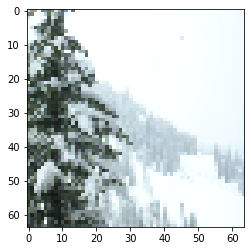

House


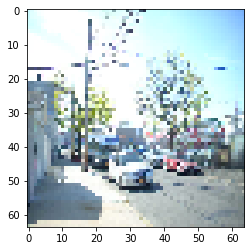

Not_House


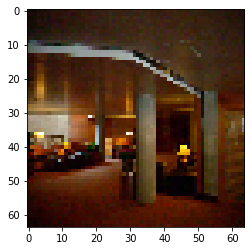

House


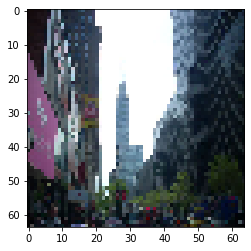

Not_House


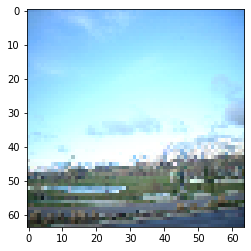

House


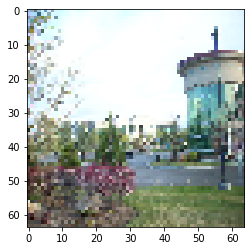

Not_House


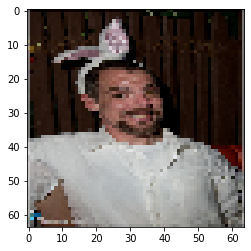

Not_House


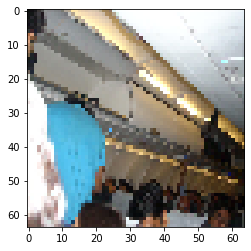

House


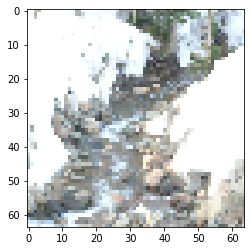

House


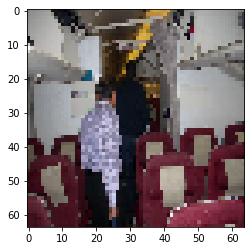

House


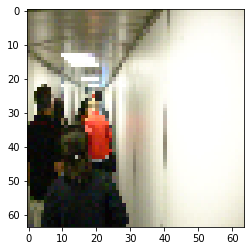

Not_House


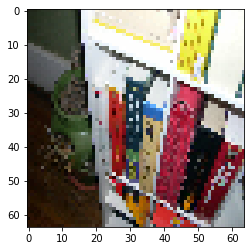

House


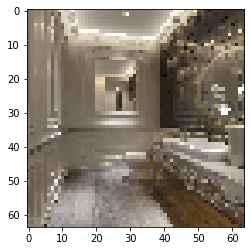

House


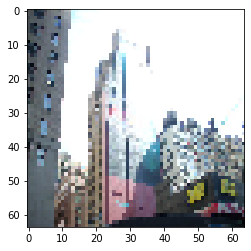

House


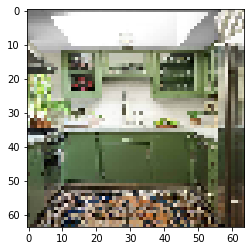

Not_House


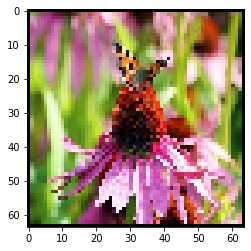

House


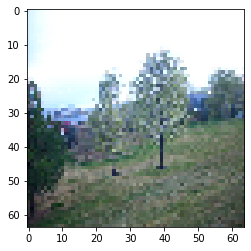

House


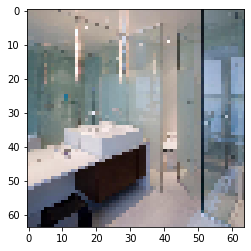

Not_House


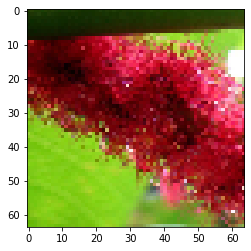

House


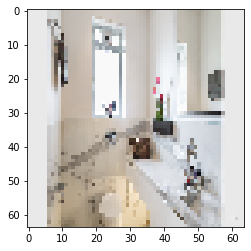

House


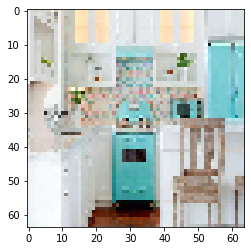

House


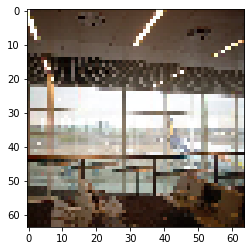

House


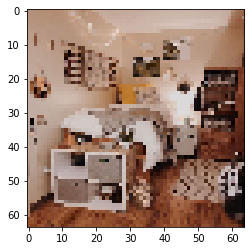

House


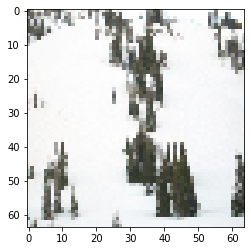

House


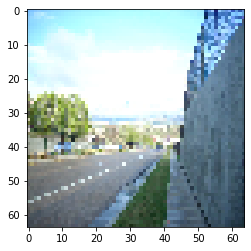

House


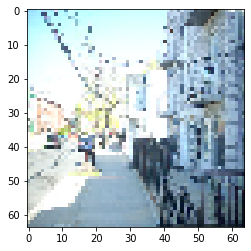

Not_House


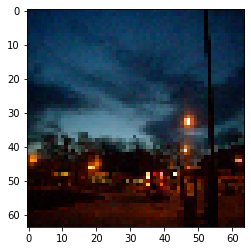

House


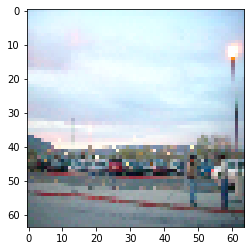

House


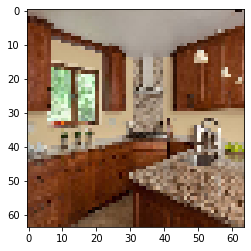

Not_House


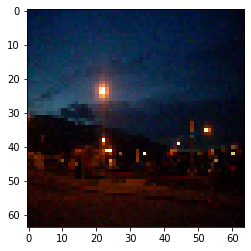

House


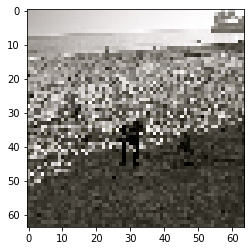

House


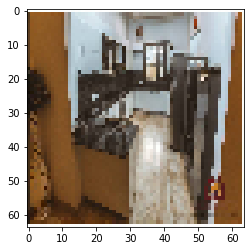

House


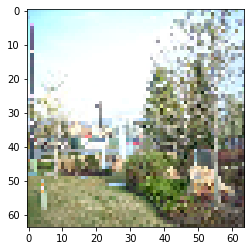

House


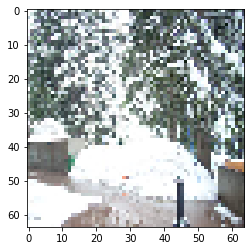

House


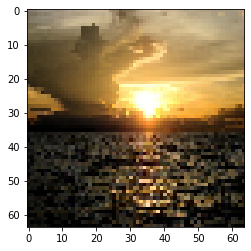

House


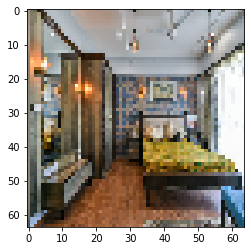

Not_House


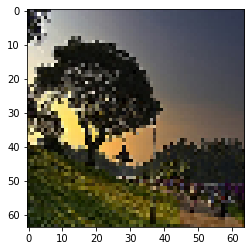

House


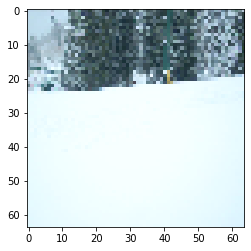

Not_House


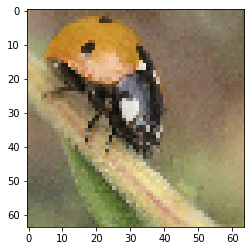

House


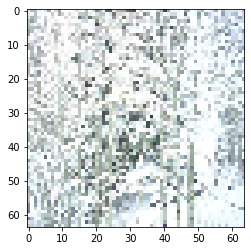

House


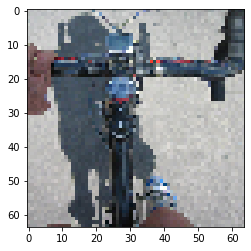

Not_House


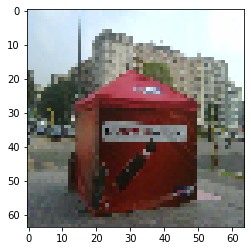

House


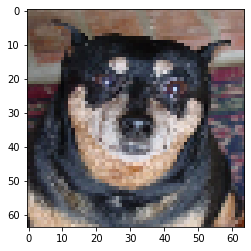

Not_House


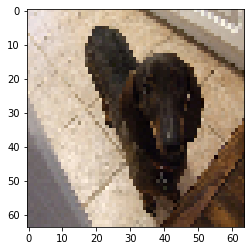

Not_House


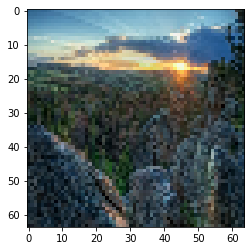

House


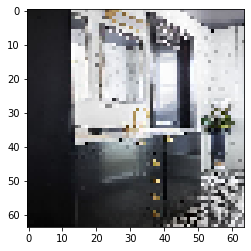

Not_House


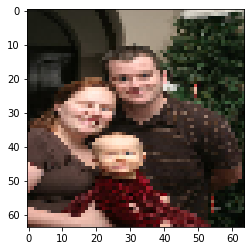

House


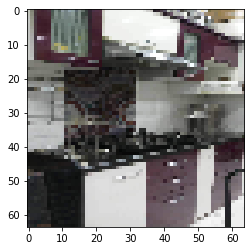

Not_House


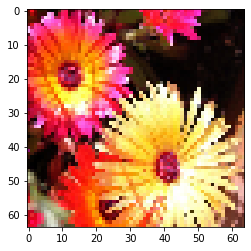

House


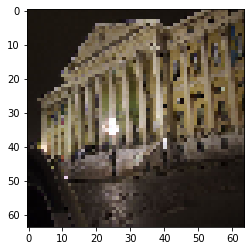

Not_House


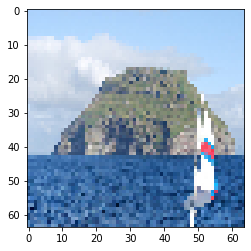

Not_House


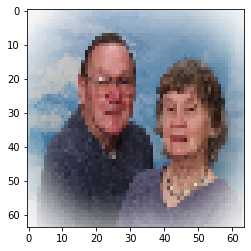

House


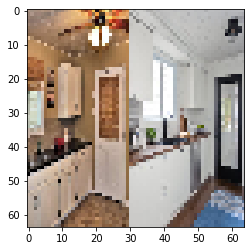

Not_House


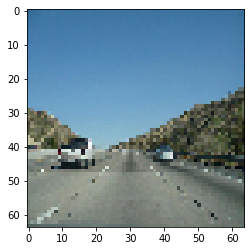

House


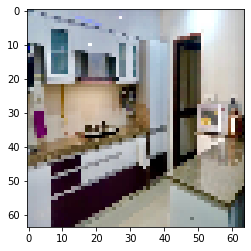

House


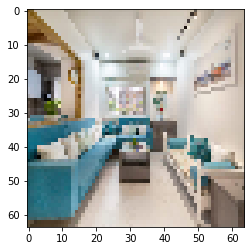

House


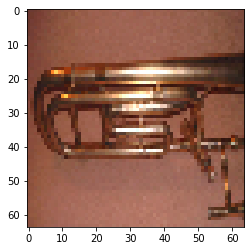

House


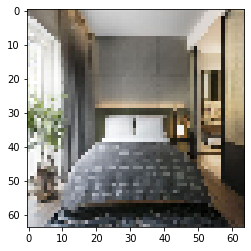

Not_House


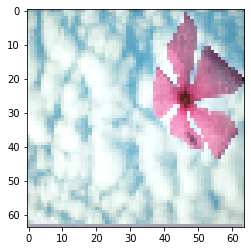

House


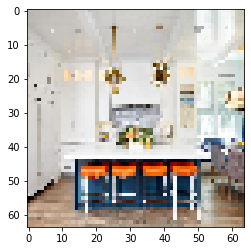

House


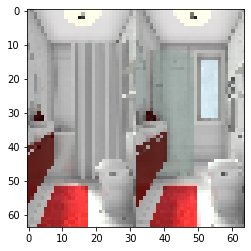

House


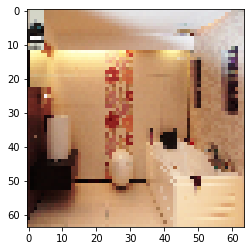

House


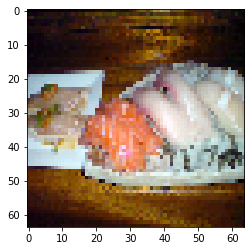

House


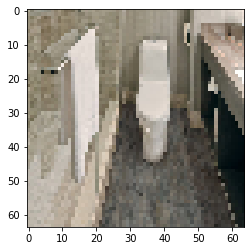

House


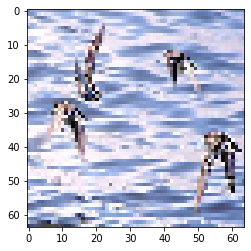

House


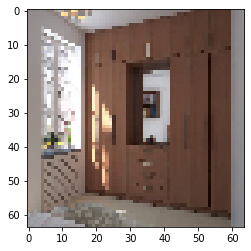

House


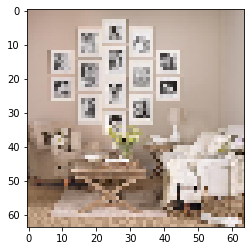

House


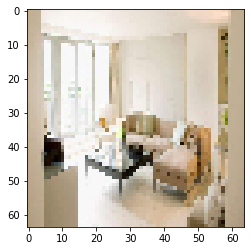

Not_House


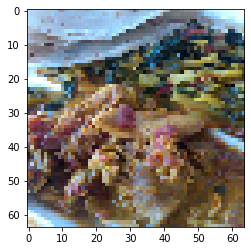

House


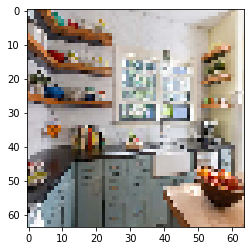

House


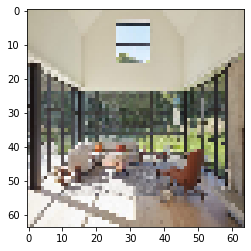

House


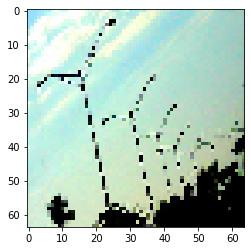

House


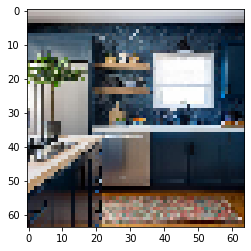

House


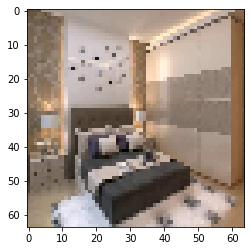

House


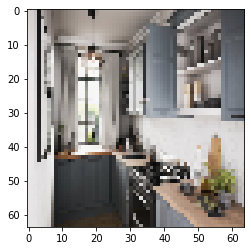

House


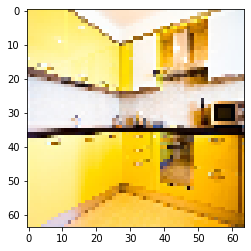

Not_House


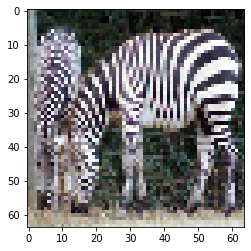

House


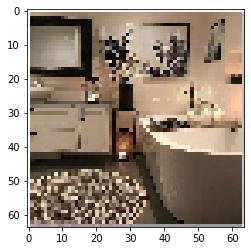

House


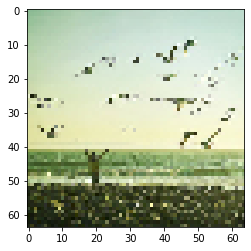

House


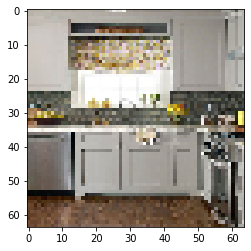

House


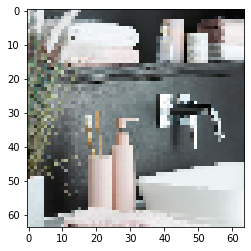

House


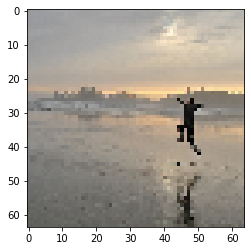

House


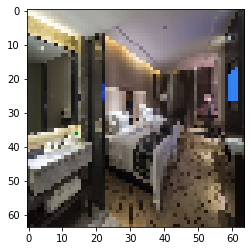

House


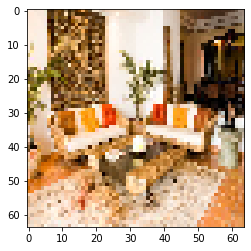

Not_House


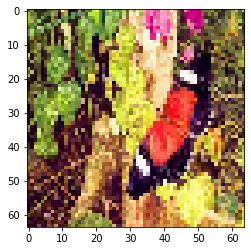

House


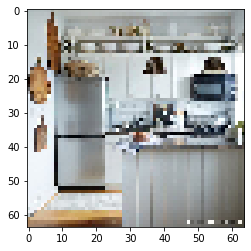

House


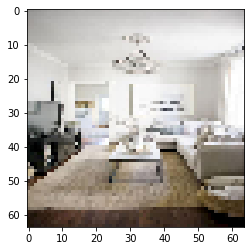

House


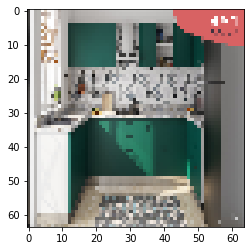

Not_House


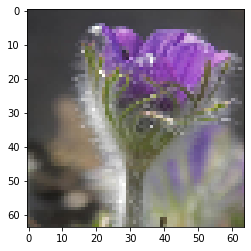

House


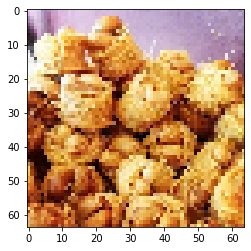

Not_House


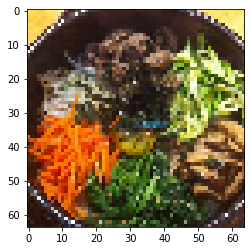

House


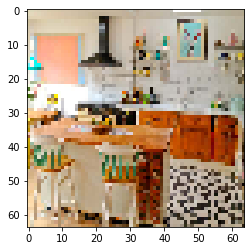

House


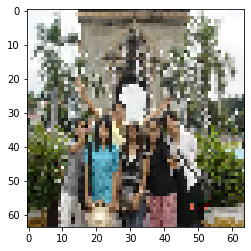

House


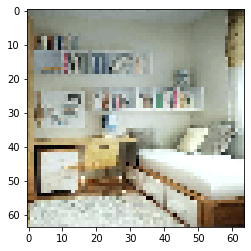

House


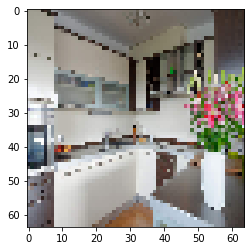

House


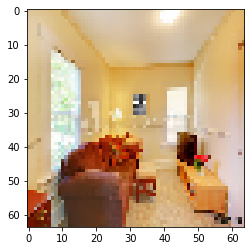

Not_House


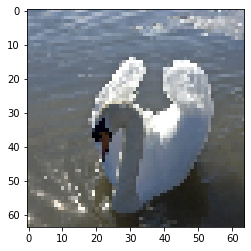

Not_House


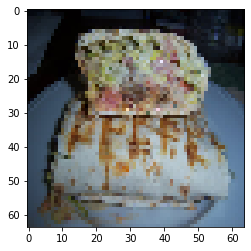

House


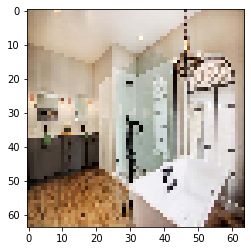

House


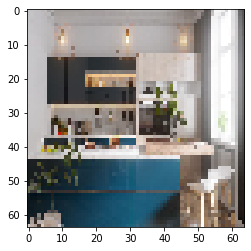

House


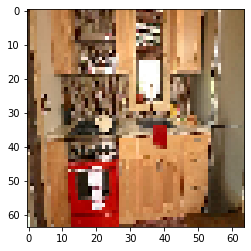

House


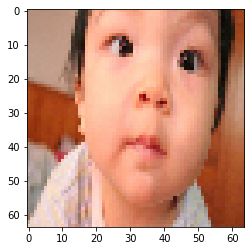

Not_House


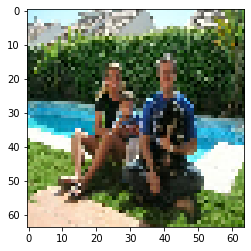

Not_House


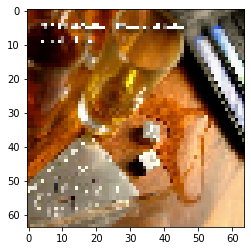

House


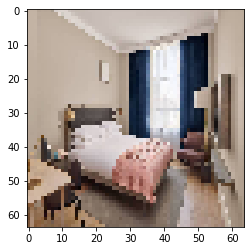

Not_House


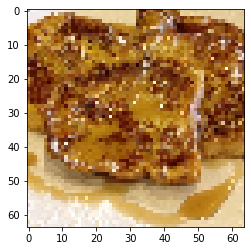

House


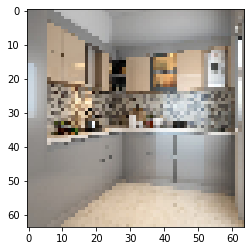

House


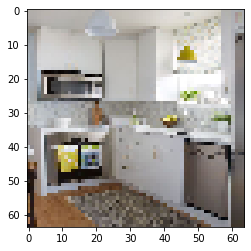

Not_House


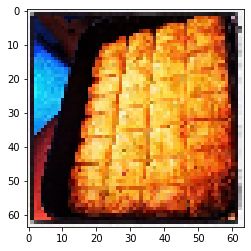

House


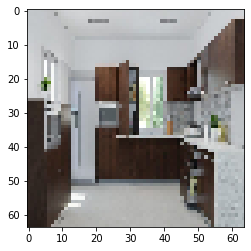

Not_House


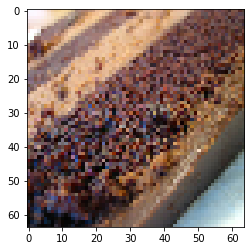

In [41]:
from matplotlib import pyplot
for filename in os.listdir(directory):
    testing_image(directory+filename)
    new_image = image.load_img(directory+filename, target_size=(64,64))
    pyplot.imshow(new_image)
    pyplot.show()

<a id='Conclusion'></a>
# 11.CONCLUSION AND INTERPRETATION

The above built model will check the image uploaded to the website if house similarities are seen it will accept, else reject if random picture is uploaded.